# Модель для оптимизации золотодобывающей отрасли

## Постановка задачи и описание данных

- Подготовить прототип модели машинного обучения для «Цифры».
- Компания разрабатывает решения для эффективной работы промышленных предприятий.
- Модель должна предсказать коэффициент восстановления золота из золотосодержащей руды. 
- Модель поможет оптимизировать производство, чтобы не запускать предприятие с убыточными характеристиками.
    
- В нашем распоряжении данные с параметрами добычи и очистки.
- В процессе работы с данными предлагается самостоятельно решить, какие детали нужны для построения модели, а какие — нет. 

Данные находятся в трёх файлах:
 - gold_recovery_train_new.csv — обучающая выборка;
 - gold_recovery_test_new.csv — тестовая выборка;
 - gold_recovery_full_new.csv — исходные данные.

- Данные индексируются датой и временем получения информации (признак date).
- Соседние по времени параметры часто похожи. 
- Некоторые параметры недоступны, потому что замеряются и/или рассчитываются значительно позже. 
- Из-за этого в тестовой выборке отсутствуют некоторые признаки, которые могут быть в обучающей. 
- Также в тестовом наборе нет целевых признаков. Исходный датасет содержит обучающую и тестовую выборки со всеми признаками.

Требуется:
 - Подготовить данные;
 - Провести исследовательский анализ данных;
 - Построить и обучить модель.

In [1]:
#basic
import pandas as pd
import numpy as np
import seaborn as sns

#basic instruments
import random
#import math

#plotting
import matplotlib.pyplot as plt
from pandas.plotting import scatter_matrix

#date and time 
import datetime 
from datetime import datetime, date

#machine learning models
#from sklearn.tree import DecisionTreeClassifier
#from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression  
from sklearn.linear_model import Lasso

#machine learning instruments
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
#from sklearn.dummy import DummyClassifier
from sklearn.dummy import DummyRegressor

from sklearn.utils import shuffle
from sklearn.metrics import homogeneity_score, make_scorer

#machine learning metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import accuracy_score, roc_auc_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.metrics import precision_recall_curve, roc_curve


#dataset settings
pd.set_option('display.max_columns', 40) #макс кол-во колонок в выводимых данных 
pd.set_option('display.max_rows', 30) #макс кол-во строк в выводимых данных
pd.set_option('display.width', 80) #макс кол-во символов в строке

from sklearn.model_selection import GridSearchCV 

#magic
%matplotlib inline

#warnings and other settings
import warnings
warnings.simplefilter('ignore')

pd.options.mode.chained_assignment = None

#data engineering instruments
#from pyspark.sql import SparkSession

## Загрузка и первичное исследование данных

In [2]:
try: 
    df_train=pd.read_csv('/datasets/gold_recovery_train_new.csv')
    df_test=pd.read_csv('/datasets/gold_recovery_test_new.csv')
    df_full=pd.read_csv('/datasets/gold_recovery_full_new.csv')
    
except: 
    df_train=pd.read_csv('datasets/gold_recovery_train_new.csv')
    df_test=pd.read_csv('datasets/gold_recovery_test_new.csv')
    df_full=pd.read_csv('datasets/gold_recovery_full_new.csv')

__Посмотрим на датасеты__

 - _df_train_

In [3]:
df_train.shape

(14149, 87)

In [4]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14149 entries, 0 to 14148
Data columns (total 87 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   date                                                14149 non-null  object 
 1   final.output.concentrate_ag                         14148 non-null  float64
 2   final.output.concentrate_pb                         14148 non-null  float64
 3   final.output.concentrate_sol                        13938 non-null  float64
 4   final.output.concentrate_au                         14149 non-null  float64
 5   final.output.recovery                               14149 non-null  float64
 6   final.output.tail_ag                                14149 non-null  float64
 7   final.output.tail_pb                                14049 non-null  float64
 8   final.output.tail_sol                               14144 non-null  float64


In [5]:
df_train=df_train.set_index('date')

In [6]:
df_train.head()

,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.output.concentrate_ag,primary_cleaner.output.concentrate_pb,primary_cleaner.output.concentrate_sol,primary_cleaner.output.concentrate_au,primary_cleaner.output.tail_ag,primary_cleaner.output.tail_pb,primary_cleaner.output.tail_sol,...,secondary_cleaner.output.tail_sol,secondary_cleaner.output.tail_au,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-01-15 00:00:00,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,127.092003,10.128295,7.25,0.988759,8.547551,10.389648,19.529297,34.174427,14.936526,2.534912,7.476074,...,8.764648,2.606185,25.853109,-498.526489,23.893660,-501.406281,23.961798,-495.262817,21.940409,-499.340973,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980
2016-01-15 01:00:00,6.029369,9.968944,5.257781,42.701629,69.266198,10.462676,0.927452,16.634514,2.224930,125.629232,10.296251,7.25,1.002663,8.558743,10.497069,19.369147,34.118526,16.250511,3.049646,6.733907,...,9.001494,2.488248,25.880539,-499.989656,23.889530,-500.372428,23.970550,-500.085473,22.085714,-499.446897,13.992281,-505.503262,11.950531,-501.331529,10.039245,-500.169983,7.984757,-500.582168,13.998353,-599.787184
2016-01-15 02:00:00,6.055926,10.213995,5.383759,42.657501,68.116445,10.507046,0.953716,16.208849,2.257889,123.819808,11.316280,7.25,0.991265,8.603505,10.354494,19.167579,33.969464,16.491823,3.124664,6.471768,...,8.842896,2.458187,26.005245,-499.929616,23.886657,-499.951928,23.913535,-499.442343,23.957717,-499.901982,14.015015,-502.520901,11.912783,-501.133383,10.070913,-500.129135,8.013877,-500.517572,14.028663,-601.427363
2016-01-15 03:00:00,6.047977,9.977019,4.858634,42.689819,68.347543,10.422762,0.883763,16.532835,2.146849,122.270188,11.322140,7.25,0.996739,7.221879,8.496563,15.978538,28.260743,16.024359,2.960362,6.843791,...,9.122857,2.322062,25.942508,-499.176749,23.955516,-499.848796,23.966838,-500.008812,23.954443,-499.944710,14.036510,-500.857308,11.999550,-501.193686,9.970366,-499.201640,7.977324,-500.255908,14.005551,-599.996129
2016-01-15 04:00:00,6.148599,10.142511,4.939416,42.774141,66.927016,10.360302,0.792826,16.525686,2.055292,117.988169,11.913613,7.25,1.009869,9.089428,9.986786,19.199864,33.044932,16.480185,3.112100,6.550154,...,8.871028,2.330448,26.024787,-500.279091,23.955345,-500.593614,23.985703,-500.083811,23.958945,-499.990309,14.027298,-499.838632,11.953070,-501.053894,9.925709,-501.686727,7.894242,-500.356035,13.996647,-601.496691


 - _df_test_

In [7]:
df_test.shape

(5290, 53)

In [8]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5290 entries, 0 to 5289
Data columns (total 53 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   date                                        5290 non-null   object 
 1   primary_cleaner.input.sulfate               5286 non-null   float64
 2   primary_cleaner.input.depressant            5285 non-null   float64
 3   primary_cleaner.input.feed_size             5290 non-null   float64
 4   primary_cleaner.input.xanthate              5286 non-null   float64
 5   primary_cleaner.state.floatbank8_a_air      5290 non-null   float64
 6   primary_cleaner.state.floatbank8_a_level    5290 non-null   float64
 7   primary_cleaner.state.floatbank8_b_air      5290 non-null   float64
 8   primary_cleaner.state.floatbank8_b_level    5290 non-null   float64
 9   primary_cleaner.state.floatbank8_c_air      5290 non-null   float64
 10  primary_clea

In [9]:
df_test=df_test.set_index('date')

In [10]:
df_test.head()

,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.feed_sol,rougher.input.feed_au,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,...,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-09-01 00:59:59,210.800909,14.993118,8.080000,1.005021,1398.981301,-500.225577,1399.144926,-499.919735,1400.102998,-500.704369,1399.001695,-499.485144,13.128569,5.636710,489.793655,62.710452,42.022440,12.084103,16.922877,6.153479,...,949.566189,-398.180807,24.938200,-500.490963,14.947607,-500.013837,20.018166,-450.395995,13.987058,-449.831513,12.023554,-497.795834,8.016656,-501.289139,7.946562,-432.317850,4.872511,-500.037437,26.705889,-499.709414
2016-09-01 01:59:59,215.392455,14.987471,8.080000,0.990469,1398.777912,-500.057435,1398.055362,-499.778182,1396.151033,-499.240168,1399.508091,-500.416324,13.036280,5.526065,490.104534,61.961163,41.187903,11.918977,17.002532,5.999043,...,950.200009,-405.787514,24.923466,-499.813963,14.930873,-500.764452,19.988503,-450.114024,14.092981,-450.059163,12.058140,-498.695773,8.130979,-499.634209,7.958270,-525.839648,4.878850,-500.162375,25.019940,-499.819438
2016-09-01 02:59:59,215.259946,12.884934,7.786667,0.996043,1398.493666,-500.868360,1398.860436,-499.764529,1398.075709,-502.151509,1399.497088,-499.715479,13.138412,5.426561,489.617969,66.903807,42.546294,12.091332,16.992520,5.850632,...,950.320481,-400.864340,24.908732,-500.304035,14.996511,-500.993821,20.039689,-450.263164,14.077881,-449.660997,11.962366,-498.767484,8.096893,-500.827423,8.071056,-500.801673,4.905125,-499.828510,24.994862,-500.622559
2016-09-01 03:59:59,215.336236,12.006805,7.640000,0.863514,1399.618111,-498.863574,1397.440120,-499.211024,1400.129303,-498.355873,1401.065165,-501.038738,12.400507,5.114758,476.618130,59.865919,41.060195,12.181597,16.532144,5.801935,...,950.735324,-399.802986,24.893998,-499.382374,14.916674,-499.862299,20.031100,-449.372570,14.013968,-449.526900,12.033091,-498.350935,8.074946,-499.474407,7.897085,-500.868509,4.931400,-499.963623,24.948919,-498.709987
2016-09-01 04:59:59,199.099327,10.682530,7.530000,0.805575,1401.268123,-500.808305,1398.128818,-499.504543,1402.172226,-500.810606,1399.480508,-499.374053,11.327427,4.767383,488.248117,63.315324,41.269161,11.290425,13.607257,5.738081,...,949.645313,-399.277632,24.886905,-499.357375,14.979233,-500.186804,19.962364,-450.638828,14.009245,-450.022259,12.025367,-500.786497,8.054678,-500.397500,8.107890,-509.526725,4.957674,-500.360026,25.003331,-500.856333


 - _df_full_

In [11]:
df_full.shape

(19439, 87)

In [12]:
df_full.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19439 entries, 0 to 19438
Data columns (total 87 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   date                                                19439 non-null  object 
 1   final.output.concentrate_ag                         19438 non-null  float64
 2   final.output.concentrate_pb                         19438 non-null  float64
 3   final.output.concentrate_sol                        19228 non-null  float64
 4   final.output.concentrate_au                         19439 non-null  float64
 5   final.output.recovery                               19439 non-null  float64
 6   final.output.tail_ag                                19438 non-null  float64
 7   final.output.tail_pb                                19338 non-null  float64
 8   final.output.tail_sol                               19433 non-null  float64


In [13]:
df_full=df_full.set_index('date')

In [14]:
df_full.head()

,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.output.concentrate_ag,primary_cleaner.output.concentrate_pb,primary_cleaner.output.concentrate_sol,primary_cleaner.output.concentrate_au,primary_cleaner.output.tail_ag,primary_cleaner.output.tail_pb,primary_cleaner.output.tail_sol,...,secondary_cleaner.output.tail_sol,secondary_cleaner.output.tail_au,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-01-15 00:00:00,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,127.092003,10.128295,7.25,0.988759,8.547551,10.389648,19.529297,34.174427,14.936526,2.534912,7.476074,...,8.764648,2.606185,25.853109,-498.526489,23.893660,-501.406281,23.961798,-495.262817,21.940409,-499.340973,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980
2016-01-15 01:00:00,6.029369,9.968944,5.257781,42.701629,69.266198,10.462676,0.927452,16.634514,2.224930,125.629232,10.296251,7.25,1.002663,8.558743,10.497069,19.369147,34.118526,16.250511,3.049646,6.733907,...,9.001494,2.488248,25.880539,-499.989656,23.889530,-500.372428,23.970550,-500.085473,22.085714,-499.446897,13.992281,-505.503262,11.950531,-501.331529,10.039245,-500.169983,7.984757,-500.582168,13.998353,-599.787184
2016-01-15 02:00:00,6.055926,10.213995,5.383759,42.657501,68.116445,10.507046,0.953716,16.208849,2.257889,123.819808,11.316280,7.25,0.991265,8.603505,10.354494,19.167579,33.969464,16.491823,3.124664,6.471768,...,8.842896,2.458187,26.005245,-499.929616,23.886657,-499.951928,23.913535,-499.442343,23.957717,-499.901982,14.015015,-502.520901,11.912783,-501.133383,10.070913,-500.129135,8.013877,-500.517572,14.028663,-601.427363
2016-01-15 03:00:00,6.047977,9.977019,4.858634,42.689819,68.347543,10.422762,0.883763,16.532835,2.146849,122.270188,11.322140,7.25,0.996739,7.221879,8.496563,15.978538,28.260743,16.024359,2.960362,6.843791,...,9.122857,2.322062,25.942508,-499.176749,23.955516,-499.848796,23.966838,-500.008812,23.954443,-499.944710,14.036510,-500.857308,11.999550,-501.193686,9.970366,-499.201640,7.977324,-500.255908,14.005551,-599.996129
2016-01-15 04:00:00,6.148599,10.142511,4.939416,42.774141,66.927016,10.360302,0.792826,16.525686,2.055292,117.988169,11.913613,7.25,1.009869,9.089428,9.986786,19.199864,33.044932,16.480185,3.112100,6.550154,...,8.871028,2.330448,26.024787,-500.279091,23.955345,-500.593614,23.985703,-500.083811,23.958945,-499.990309,14.027298,-499.838632,11.953070,-501.053894,9.925709,-501.686727,7.894242,-500.356035,13.996647,-601.496691


df_full является суммой первых двух датасетов, т.е. для обучения и теста будем использовать df_train, df_test. 
Посмотрим, что есть в df_train и нет в df_test:

In [15]:
set(df_train.columns) - set(df_test.columns)

{'final.output.concentrate_ag',
 'final.output.concentrate_au',
 'final.output.concentrate_pb',
 'final.output.concentrate_sol',
 'final.output.recovery',
 'final.output.tail_ag',
 'final.output.tail_au',
 'final.output.tail_pb',
 'final.output.tail_sol',
 'primary_cleaner.output.concentrate_ag',
 'primary_cleaner.output.concentrate_au',
 'primary_cleaner.output.concentrate_pb',
 'primary_cleaner.output.concentrate_sol',
 'primary_cleaner.output.tail_ag',
 'primary_cleaner.output.tail_au',
 'primary_cleaner.output.tail_pb',
 'primary_cleaner.output.tail_sol',
 'rougher.calculation.au_pb_ratio',
 'rougher.calculation.floatbank10_sulfate_to_au_feed',
 'rougher.calculation.floatbank11_sulfate_to_au_feed',
 'rougher.calculation.sulfate_to_au_concentrate',
 'rougher.output.concentrate_ag',
 'rougher.output.concentrate_au',
 'rougher.output.concentrate_pb',
 'rougher.output.concentrate_sol',
 'rougher.output.recovery',
 'rougher.output.tail_ag',
 'rougher.output.tail_au',
 'rougher.output.ta

df_test не содержит output по всем этапам, по понятным причинам - т.к. это целевые признаки, а также не содержит признаков calculation для этапа обогащение(rougher), поскольку, видимо, эти данные не доступны во время технологического процесса и появляются позже.

__Ответы к df_test__

Поскольку, в соответствии с данными проекта, в датасете с тестом ответов нет, сразу извлечем их из датафрейма с полными данными и запишем в переменную test_answers_final_output.

In [16]:
test_index=list(df_test.index)
test_answers=df_full[['rougher.output.recovery', 'final.output.recovery']]
test_answers=test_answers[test_answers.index.isin(test_index)]
test_answers.head()

,rougher.output.recovery,final.output.recovery
date,,
2016-09-01 00:59:59,89.993421,70.273583
2016-09-01 01:59:59,88.089657,68.910432
2016-09-01 02:59:59,88.412756,68.143213
2016-09-01 03:59:59,87.360133,67.776393
2016-09-01 04:59:59,83.236367,61.467078


In [17]:
test_answers.shape

(5290, 2)

In [18]:
test_answers.isna().sum()

rougher.output.recovery    0
final.output.recovery      0
dtype: int64

__Проверка правильности расчета эффективности обогащения__

Проверим, что эффективность обогащения рассчитана правильно. Вычислим её на обучающей выборке для признака rougher.output.recovery. Найдем MAE между нашими расчётами и значением признака.

In [19]:
def rec_function (C, F, T):    
    numerator = (C*(F-T))
    denominator =(F*(C-T))    
    recovery_value = (numerator / denominator)* 100
    recovery_value[recovery_value<0] = np.nan
    recovery_value[recovery_value>100] = np.nan
    return recovery_value

In [20]:
t = df_train['rougher.output.tail_au']
f = df_train['rougher.input.feed_au']
c = df_train['rougher.output.concentrate_au']
recover_counted = rec_function(c, f, t)
df_train['recover_to_check'] = recover_counted
df_train.head()

,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.output.concentrate_ag,primary_cleaner.output.concentrate_pb,primary_cleaner.output.concentrate_sol,primary_cleaner.output.concentrate_au,primary_cleaner.output.tail_ag,primary_cleaner.output.tail_pb,primary_cleaner.output.tail_sol,...,secondary_cleaner.output.tail_au,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level,recover_to_check
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-01-15 00:00:00,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,127.092003,10.128295,7.25,0.988759,8.547551,10.389648,19.529297,34.174427,14.936526,2.534912,7.476074,...,2.606185,25.853109,-498.526489,23.893660,-501.406281,23.961798,-495.262817,21.940409,-499.340973,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980,87.107763
2016-01-15 01:00:00,6.029369,9.968944,5.257781,42.701629,69.266198,10.462676,0.927452,16.634514,2.224930,125.629232,10.296251,7.25,1.002663,8.558743,10.497069,19.369147,34.118526,16.250511,3.049646,6.733907,...,2.488248,25.880539,-499.989656,23.889530,-500.372428,23.970550,-500.085473,22.085714,-499.446897,13.992281,-505.503262,11.950531,-501.331529,10.039245,-500.169983,7.984757,-500.582168,13.998353,-599.787184,86.843261
2016-01-15 02:00:00,6.055926,10.213995,5.383759,42.657501,68.116445,10.507046,0.953716,16.208849,2.257889,123.819808,11.316280,7.25,0.991265,8.603505,10.354494,19.167579,33.969464,16.491823,3.124664,6.471768,...,2.458187,26.005245,-499.929616,23.886657,-499.951928,23.913535,-499.442343,23.957717,-499.901982,14.015015,-502.520901,11.912783,-501.133383,10.070913,-500.129135,8.013877,-500.517572,14.028663,-601.427363,86.842308
2016-01-15 03:00:00,6.047977,9.977019,4.858634,42.689819,68.347543,10.422762,0.883763,16.532835,2.146849,122.270188,11.322140,7.25,0.996739,7.221879,8.496563,15.978538,28.260743,16.024359,2.960362,6.843791,...,2.322062,25.942508,-499.176749,23.955516,-499.848796,23.966838,-500.008812,23.954443,-499.944710,14.036510,-500.857308,11.999550,-501.193686,9.970366,-499.201640,7.977324,-500.255908,14.005551,-599.996129,87.226430
2016-01-15 04:00:00,6.148599,10.142511,4.939416,42.774141,66.927016,10.360302,0.792826,16.525686,2.055292,117.988169,11.913613,7.25,1.009869,9.089428,9.986786,19.199864,33.044932,16.480185,3.112100,6.550154,...,2.330448,26.024787,-500.279091,23.955345,-500.593614,23.985703,-500.083811,23.958945,-499.990309,14.027298,-499.838632,11.953070,-501.053894,9.925709,-501.686727,7.894242,-500.356035,13.996647,-601.496691,86.688794


In [21]:
df_train['recover_mae']=abs(df_train['rougher.output.recovery']-df_train['recover_to_check'])
df_train.head()

,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.output.concentrate_ag,primary_cleaner.output.concentrate_pb,primary_cleaner.output.concentrate_sol,primary_cleaner.output.concentrate_au,primary_cleaner.output.tail_ag,primary_cleaner.output.tail_pb,primary_cleaner.output.tail_sol,...,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level,recover_to_check,recover_mae
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-01-15 00:00:00,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,127.092003,10.128295,7.25,0.988759,8.547551,10.389648,19.529297,34.174427,14.936526,2.534912,7.476074,...,25.853109,-498.526489,23.893660,-501.406281,23.961798,-495.262817,21.940409,-499.340973,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980,87.107763,0.000000e+00
2016-01-15 01:00:00,6.029369,9.968944,5.257781,42.701629,69.266198,10.462676,0.927452,16.634514,2.224930,125.629232,10.296251,7.25,1.002663,8.558743,10.497069,19.369147,34.118526,16.250511,3.049646,6.733907,...,25.880539,-499.989656,23.889530,-500.372428,23.970550,-500.085473,22.085714,-499.446897,13.992281,-505.503262,11.950531,-501.331529,10.039245,-500.169983,7.984757,-500.582168,13.998353,-599.787184,86.843261,1.421085e-14
2016-01-15 02:00:00,6.055926,10.213995,5.383759,42.657501,68.116445,10.507046,0.953716,16.208849,2.257889,123.819808,11.316280,7.25,0.991265,8.603505,10.354494,19.167579,33.969464,16.491823,3.124664,6.471768,...,26.005245,-499.929616,23.886657,-499.951928,23.913535,-499.442343,23.957717,-499.901982,14.015015,-502.520901,11.912783,-501.133383,10.070913,-500.129135,8.013877,-500.517572,14.028663,-601.427363,86.842308,1.421085e-14
2016-01-15 03:00:00,6.047977,9.977019,4.858634,42.689819,68.347543,10.422762,0.883763,16.532835,2.146849,122.270188,11.322140,7.25,0.996739,7.221879,8.496563,15.978538,28.260743,16.024359,2.960362,6.843791,...,25.942508,-499.176749,23.955516,-499.848796,23.966838,-500.008812,23.954443,-499.944710,14.036510,-500.857308,11.999550,-501.193686,9.970366,-499.201640,7.977324,-500.255908,14.005551,-599.996129,87.226430,0.000000e+00
2016-01-15 04:00:00,6.148599,10.142511,4.939416,42.774141,66.927016,10.360302,0.792826,16.525686,2.055292,117.988169,11.913613,7.25,1.009869,9.089428,9.986786,19.199864,33.044932,16.480185,3.112100,6.550154,...,26.024787,-500.279091,23.955345,-500.593614,23.985703,-500.083811,23.958945,-499.990309,14.027298,-499.838632,11.953070,-501.053894,9.925709,-501.686727,7.894242,-500.356035,13.996647,-601.496691,86.688794,0.000000e+00


In [22]:
df_train['recover_mae'].sum()

1.3774226204077422e-10

MAE мала, поэтому будем считать, что применение формулы и расчет выполнены верно.

Посмотрим, какие данные в датасетах train, test пропущены:

In [23]:
def na_function (dataframe):
    na_info = (dataframe.isna() | dataframe.isnull()).sum()
    result = (pd.concat([na_info / dataframe.shape[0], na_info], axis=1,  keys=['percent', 'abs']).sort_values(
        'percent', ascending=False))
    return result

In [24]:
na_function(df_train)

,percent,abs
secondary_cleaner.output.tail_sol,0.113436,1605
rougher.state.floatbank10_e_air,0.030815,436
rougher.input.floatbank11_xanthate,0.030249,428
primary_cleaner.output.concentrate_sol,0.020213,286
secondary_cleaner.state.floatbank2_a_air,0.015337,217
...,...,...
rougher.output.tail_au,0.000000,0
rougher.state.floatbank10_d_air,0.000000,0
rougher.state.floatbank10_d_level,0.000000,0
rougher.state.floatbank10_e_level,0.000000,0


In [25]:
na_function(df_test)

,percent,abs
rougher.input.floatbank11_xanthate,0.004726,25
rougher.input.feed_sol,0.003970,21
secondary_cleaner.state.floatbank3_a_air,0.001701,9
rougher.input.floatbank11_sulfate,0.001512,8
primary_cleaner.input.depressant,0.000945,5
...,...,...
rougher.state.floatbank10_a_level,0.000000,0
rougher.state.floatbank10_b_air,0.000000,0
rougher.state.floatbank10_b_level,0.000000,0
rougher.state.floatbank10_c_level,0.000000,0


Количество пропущенных значений в df_test менее существенно, чем в df_train, они в output и не относятся к выходу золота, а также недостаток информации от флотирующих установок (если бы было возможно, то задать вопрос о том, случайны ли эти пропуски в данных или какие-то установки не подают данные по причине системных сбоев или ошибок), но и тем не менее, они незначительны.

Поскольку данные у нас, согласно описанию проекта, индексируются временем, то логично заполнить пропуски интерполяциями. 

In [26]:
df_train.isna().sum().sort_values(ascending=False).head(20)

secondary_cleaner.output.tail_sol           1605
rougher.state.floatbank10_e_air              436
rougher.input.floatbank11_xanthate           428
primary_cleaner.output.concentrate_sol       286
secondary_cleaner.state.floatbank2_a_air     217
final.output.concentrate_sol                 211
rougher.input.feed_size                      144
final.output.tail_pb                         100
rougher.input.feed_pb                        100
primary_cleaner.input.xanthate               100
primary_cleaner.output.concentrate_pb         86
rougher.input.feed_sol                        78
primary_cleaner.output.tail_sol               46
rougher.input.floatbank11_sulfate             36
primary_cleaner.input.depressant              32
rougher.input.floatbank10_sulfate             29
rougher.output.concentrate_sol                22
secondary_cleaner.state.floatbank2_b_air      21
primary_cleaner.input.sulfate                 20
primary_cleaner.output.tail_pb                15
dtype: int64

In [27]:
df_train.interpolate(method='linear', inplace=True)

In [28]:
df_train.isna().sum().sort_values(ascending=False).head(20)

final.output.concentrate_ag          0
final.output.concentrate_pb          0
secondary_cleaner.output.tail_ag     0
rougher.state.floatbank10_f_level    0
rougher.state.floatbank10_f_air      0
rougher.state.floatbank10_e_level    0
rougher.state.floatbank10_e_air      0
rougher.state.floatbank10_d_level    0
rougher.state.floatbank10_d_air      0
rougher.state.floatbank10_c_level    0
rougher.state.floatbank10_c_air      0
rougher.state.floatbank10_b_level    0
rougher.state.floatbank10_b_air      0
rougher.state.floatbank10_a_level    0
rougher.state.floatbank10_a_air      0
rougher.output.tail_au               0
rougher.output.tail_sol              0
rougher.output.tail_pb               0
rougher.output.tail_ag               0
rougher.output.recovery              0
dtype: int64

In [29]:
df_test.isna().sum().sort_values(ascending=False).head(15)

rougher.input.floatbank11_xanthate            25
rougher.input.feed_sol                        21
secondary_cleaner.state.floatbank3_a_air       9
rougher.input.floatbank11_sulfate              8
primary_cleaner.input.depressant               5
rougher.input.floatbank10_sulfate              5
primary_cleaner.input.sulfate                  4
primary_cleaner.input.xanthate                 4
rougher.input.feed_rate                        3
secondary_cleaner.state.floatbank2_a_air       3
secondary_cleaner.state.floatbank2_b_air       2
rougher.input.feed_size                        1
secondary_cleaner.state.floatbank3_b_level     0
secondary_cleaner.state.floatbank3_b_air       0
rougher.state.floatbank10_f_air                0
dtype: int64

In [30]:
df_test.interpolate(method='linear', inplace=True)

In [31]:
df_test.isna().sum().sort_values(ascending=False).head(15)

primary_cleaner.input.sulfate                 0
primary_cleaner.input.depressant              0
rougher.state.floatbank10_d_air               0
rougher.state.floatbank10_d_level             0
rougher.state.floatbank10_e_air               0
rougher.state.floatbank10_e_level             0
rougher.state.floatbank10_f_air               0
rougher.state.floatbank10_f_level             0
secondary_cleaner.state.floatbank2_a_air      0
secondary_cleaner.state.floatbank2_a_level    0
secondary_cleaner.state.floatbank2_b_air      0
secondary_cleaner.state.floatbank2_b_level    0
secondary_cleaner.state.floatbank3_a_air      0
secondary_cleaner.state.floatbank3_a_level    0
secondary_cleaner.state.floatbank3_b_air      0
dtype: int64

## Подготовка данных для ML

Удалим из df_train признаки, которых нет в df_test.

In [32]:
features_train = df_train[df_test.columns]
features_train.head()

,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.feed_sol,rougher.input.feed_au,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,...,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-01-15 00:00:00,127.092003,10.128295,7.25,0.988759,1549.775757,-498.912140,1551.434204,-516.403442,1549.873901,-498.666595,1554.367432,-493.428131,6.100378,2.284912,523.546326,55.486599,36.808594,6.486150,11.986616,6.007990,...,1416.354980,-451.939636,25.853109,-498.526489,23.893660,-501.406281,23.961798,-495.262817,21.940409,-499.340973,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980
2016-01-15 01:00:00,125.629232,10.296251,7.25,1.002663,1576.166671,-500.904965,1575.950626,-499.865889,1575.994189,-499.315107,1574.479259,-498.931665,6.161113,2.266033,525.290581,57.278666,35.753385,6.478583,11.971193,6.005766,...,1399.719514,-450.119001,25.880539,-499.989656,23.889530,-500.372428,23.970550,-500.085473,22.085714,-499.446897,13.992281,-505.503262,11.950531,-501.331529,10.039245,-500.169983,7.984757,-500.582168,13.998353,-599.787184
2016-01-15 02:00:00,123.819808,11.316280,7.25,0.991265,1601.556163,-499.997791,1600.386685,-500.607762,1602.003542,-500.870069,1599.541515,-499.827444,6.116455,2.159622,530.026610,57.510649,35.971630,6.362222,11.920603,6.197377,...,1400.316682,-450.527147,26.005245,-499.929616,23.886657,-499.951928,23.913535,-499.442343,23.957717,-499.901982,14.015015,-502.520901,11.912783,-501.133383,10.070913,-500.129135,8.013877,-500.517572,14.028663,-601.427363
2016-01-15 03:00:00,122.270188,11.322140,7.25,0.996739,1599.968720,-500.951778,1600.659236,-499.677094,1600.304144,-500.727997,1600.449520,-500.052575,6.043309,2.037807,542.590390,57.792734,36.862241,6.118189,11.630094,6.203177,...,1400.234743,-449.790835,25.942508,-499.176749,23.955516,-499.848796,23.966838,-500.008812,23.954443,-499.944710,14.036510,-500.857308,11.999550,-501.193686,9.970366,-499.201640,7.977324,-500.255908,14.005551,-599.996129
2016-01-15 04:00:00,117.988169,11.913613,7.25,1.009869,1601.339707,-498.975456,1601.437854,-500.323246,1599.581894,-500.888152,1602.649541,-500.593010,6.060915,1.786875,540.531893,56.047189,34.347666,5.663707,10.957755,6.198826,...,1401.160227,-450.407128,26.024787,-500.279091,23.955345,-500.593614,23.985703,-500.083811,23.958945,-499.990309,14.027298,-499.838632,11.953070,-501.053894,9.925709,-501.686727,7.894242,-500.356035,13.996647,-601.496691


Поскольку процессы routher и cleaner в описании задания указаны как независимые, и суммарная метрика-ошибка складывается из ошибок этих двух процессов, то предсказывать их тоже будем независимо. Разделим данные на признаки для обучения и целевые (features, target) и разделим датасет на части исходя из логики о независимости этих двух процессов.

In [33]:
rougher_names=features_train.columns.str.contains('rougher')
features_train_rougher=features_train.loc[:, rougher_names]
features_train_rougher.head()

,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.feed_sol,rougher.input.feed_au,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_b_air,rougher.state.floatbank10_b_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_c_level,rougher.state.floatbank10_d_air,rougher.state.floatbank10_d_level,rougher.state.floatbank10_e_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level
date,,,,,,,,,,,,,,,,,,,,,,
2016-01-15 00:00:00,6.100378,2.284912,523.546326,55.486599,36.808594,6.486150,11.986616,6.007990,11.836743,6.005818,999.706909,-404.066986,1603.011353,-434.715027,1602.375000,-442.204468,1598.937256,-451.294128,1404.472046,-455.462982,1416.354980,-451.939636
2016-01-15 01:00:00,6.161113,2.266033,525.290581,57.278666,35.753385,6.478583,11.971193,6.005766,11.996163,6.012594,1000.286398,-400.065196,1600.754587,-449.953435,1600.479580,-449.830646,1600.527589,-449.953649,1399.227084,-450.869848,1399.719514,-450.119001
2016-01-15 02:00:00,6.116455,2.159622,530.026610,57.510649,35.971630,6.362222,11.920603,6.197377,11.920305,6.204633,999.719565,-400.074028,1599.337330,-450.008530,1599.672797,-449.954491,1599.849325,-449.954185,1399.180945,-449.937588,1400.316682,-450.527147
2016-01-15 03:00:00,6.043309,2.037807,542.590390,57.792734,36.862241,6.118189,11.630094,6.203177,11.692450,6.196578,999.814770,-400.200179,1600.059442,-450.619948,1600.012842,-449.910497,1597.725177,-450.130127,1400.943157,-450.030142,1400.234743,-449.790835
2016-01-15 04:00:00,6.060915,1.786875,540.531893,56.047189,34.347666,5.663707,10.957755,6.198826,10.960521,6.194897,999.678690,-399.752729,1600.208824,-449.599614,1600.357732,-450.034364,1599.759049,-449.909799,1401.560902,-448.877187,1401.160227,-450.407128


In [34]:
features_train_rougher.shape

(14149, 22)

In [35]:
features_test_rougher=df_test.loc[:, rougher_names]
features_test_rougher.head()

,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.feed_sol,rougher.input.feed_au,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_b_air,rougher.state.floatbank10_b_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_c_level,rougher.state.floatbank10_d_air,rougher.state.floatbank10_d_level,rougher.state.floatbank10_e_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level
date,,,,,,,,,,,,,,,,,,,,,,
2016-09-01 00:59:59,13.128569,5.636710,489.793655,62.710452,42.022440,12.084103,16.922877,6.153479,16.867518,6.150709,1001.849317,-350.301265,1249.738612,-399.107531,1249.750520,-399.396730,1198.287855,-399.488594,999.472250,-399.530962,949.566189,-398.180807
2016-09-01 01:59:59,13.036280,5.526065,490.104534,61.961163,41.187903,11.918977,17.002532,5.999043,16.996063,6.002315,998.690785,-350.425704,1248.395457,-399.946025,1249.514451,-399.630810,1200.506459,-399.942434,1000.002114,-399.491528,950.200009,-405.787514
2016-09-01 02:59:59,13.138412,5.426561,489.617969,66.903807,42.546294,12.091332,16.992520,5.850632,16.982096,5.853594,998.516720,-349.783538,1247.440748,-400.264330,1248.207204,-401.074405,1199.770026,-400.790582,999.925519,-399.236999,950.320481,-400.864340
2016-09-01 03:59:59,12.400507,5.114758,476.618130,59.865919,41.060195,12.181597,16.532144,5.801935,16.515277,5.803657,1000.276604,-350.172597,1251.322675,-398.655289,1250.493702,-399.746728,1199.398691,-397.503052,1001.930679,-400.437573,950.735324,-399.802986
2016-09-01 04:59:59,11.327427,4.767383,488.248117,63.315324,41.269161,11.290425,13.607257,5.738081,13.650053,5.739634,996.541302,-350.562517,1304.658848,-399.511519,1306.455515,-399.050685,1248.699349,-400.876894,1058.839106,-398.988239,949.645313,-399.277632


In [36]:
features_test_rougher.shape

(5290, 22)

In [37]:
target_train_rougher=df_train['rougher.output.recovery']
target_train_rougher.head()

date
2016-01-15 00:00:00    87.107763
2016-01-15 01:00:00    86.843261
2016-01-15 02:00:00    86.842308
2016-01-15 03:00:00    87.226430
2016-01-15 04:00:00    86.688794
Name: rougher.output.recovery, dtype: float64

In [38]:
target_train_rougher.isna().sum()

0

In [39]:
cleaner_names=features_train.columns.str.contains('cleaner')
features_train_cleaner=features_train.loc[:, cleaner_names]
features_train_cleaner.head()

,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-01-15 00:00:00,127.092003,10.128295,7.25,0.988759,1549.775757,-498.912140,1551.434204,-516.403442,1549.873901,-498.666595,1554.367432,-493.428131,25.853109,-498.526489,23.893660,-501.406281,23.961798,-495.262817,21.940409,-499.340973,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980
2016-01-15 01:00:00,125.629232,10.296251,7.25,1.002663,1576.166671,-500.904965,1575.950626,-499.865889,1575.994189,-499.315107,1574.479259,-498.931665,25.880539,-499.989656,23.889530,-500.372428,23.970550,-500.085473,22.085714,-499.446897,13.992281,-505.503262,11.950531,-501.331529,10.039245,-500.169983,7.984757,-500.582168,13.998353,-599.787184
2016-01-15 02:00:00,123.819808,11.316280,7.25,0.991265,1601.556163,-499.997791,1600.386685,-500.607762,1602.003542,-500.870069,1599.541515,-499.827444,26.005245,-499.929616,23.886657,-499.951928,23.913535,-499.442343,23.957717,-499.901982,14.015015,-502.520901,11.912783,-501.133383,10.070913,-500.129135,8.013877,-500.517572,14.028663,-601.427363
2016-01-15 03:00:00,122.270188,11.322140,7.25,0.996739,1599.968720,-500.951778,1600.659236,-499.677094,1600.304144,-500.727997,1600.449520,-500.052575,25.942508,-499.176749,23.955516,-499.848796,23.966838,-500.008812,23.954443,-499.944710,14.036510,-500.857308,11.999550,-501.193686,9.970366,-499.201640,7.977324,-500.255908,14.005551,-599.996129
2016-01-15 04:00:00,117.988169,11.913613,7.25,1.009869,1601.339707,-498.975456,1601.437854,-500.323246,1599.581894,-500.888152,1602.649541,-500.593010,26.024787,-500.279091,23.955345,-500.593614,23.985703,-500.083811,23.958945,-499.990309,14.027298,-499.838632,11.953070,-501.053894,9.925709,-501.686727,7.894242,-500.356035,13.996647,-601.496691


In [40]:
features_train_cleaner.shape

(14149, 30)

In [41]:
features_test_cleaner=df_test.loc[:, cleaner_names]
features_test_cleaner.head()

,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-09-01 00:59:59,210.800909,14.993118,8.080000,1.005021,1398.981301,-500.225577,1399.144926,-499.919735,1400.102998,-500.704369,1399.001695,-499.485144,24.938200,-500.490963,14.947607,-500.013837,20.018166,-450.395995,13.987058,-449.831513,12.023554,-497.795834,8.016656,-501.289139,7.946562,-432.317850,4.872511,-500.037437,26.705889,-499.709414
2016-09-01 01:59:59,215.392455,14.987471,8.080000,0.990469,1398.777912,-500.057435,1398.055362,-499.778182,1396.151033,-499.240168,1399.508091,-500.416324,24.923466,-499.813963,14.930873,-500.764452,19.988503,-450.114024,14.092981,-450.059163,12.058140,-498.695773,8.130979,-499.634209,7.958270,-525.839648,4.878850,-500.162375,25.019940,-499.819438
2016-09-01 02:59:59,215.259946,12.884934,7.786667,0.996043,1398.493666,-500.868360,1398.860436,-499.764529,1398.075709,-502.151509,1399.497088,-499.715479,24.908732,-500.304035,14.996511,-500.993821,20.039689,-450.263164,14.077881,-449.660997,11.962366,-498.767484,8.096893,-500.827423,8.071056,-500.801673,4.905125,-499.828510,24.994862,-500.622559
2016-09-01 03:59:59,215.336236,12.006805,7.640000,0.863514,1399.618111,-498.863574,1397.440120,-499.211024,1400.129303,-498.355873,1401.065165,-501.038738,24.893998,-499.382374,14.916674,-499.862299,20.031100,-449.372570,14.013968,-449.526900,12.033091,-498.350935,8.074946,-499.474407,7.897085,-500.868509,4.931400,-499.963623,24.948919,-498.709987
2016-09-01 04:59:59,199.099327,10.682530,7.530000,0.805575,1401.268123,-500.808305,1398.128818,-499.504543,1402.172226,-500.810606,1399.480508,-499.374053,24.886905,-499.357375,14.979233,-500.186804,19.962364,-450.638828,14.009245,-450.022259,12.025367,-500.786497,8.054678,-500.397500,8.107890,-509.526725,4.957674,-500.360026,25.003331,-500.856333


In [42]:
features_test_cleaner.shape

(5290, 30)

In [43]:
target_train_cleaner = df_train['final.output.recovery']
target_train_cleaner.head()

date
2016-01-15 00:00:00    70.541216
2016-01-15 01:00:00    69.266198
2016-01-15 02:00:00    68.116445
2016-01-15 03:00:00    68.347543
2016-01-15 04:00:00    66.927016
Name: final.output.recovery, dtype: float64

In [44]:
target_train_cleaner.isna().sum()

0

In [45]:
features_train_rougher_names=list(features_train_rougher.columns)
features_train_cleaner_names=list(features_train_cleaner.columns)

## Анализ данных

__Изменение концентрации металлов__

Посмотрим, как меняется концентрация металлов (Au, Ag, Pb) на различных этапах очистки. Исходя из описания технологического процесса, которое у нас есть, построим распределения концентраций металов на входе и выходе этапов. 

Вспомним наиболее полный перечень столбцов - из df_train.

In [46]:
df_train.columns

Index(['final.output.concentrate_ag', 'final.output.concentrate_pb',
       'final.output.concentrate_sol', 'final.output.concentrate_au',
       'final.output.recovery', 'final.output.tail_ag', 'final.output.tail_pb',
       'final.output.tail_sol', 'final.output.tail_au',
       'primary_cleaner.input.sulfate', 'primary_cleaner.input.depressant',
       'primary_cleaner.input.feed_size', 'primary_cleaner.input.xanthate',
       'primary_cleaner.output.concentrate_ag',
       'primary_cleaner.output.concentrate_pb',
       'primary_cleaner.output.concentrate_sol',
       'primary_cleaner.output.concentrate_au',
       'primary_cleaner.output.tail_ag', 'primary_cleaner.output.tail_pb',
       'primary_cleaner.output.tail_sol', 'primary_cleaner.output.tail_au',
       'primary_cleaner.state.floatbank8_a_air',
       'primary_cleaner.state.floatbank8_a_level',
       'primary_cleaner.state.floatbank8_b_air',
       'primary_cleaner.state.floatbank8_b_level',
       'primary_cleaner.state

Подготовим списки для "сборки" в циклах при построении графиков: 

In [47]:
stage_list = ['rougher.input.feed', 'rougher.output.concentrate', 'primary_cleaner.output.concentrate', 
              'final.output.concentrate']
tails_list = ['rougher.input.feed', 'rougher.output.tail', 'primary_cleaner.output.tail', 'final.output.tail']
metals_list = ['au', 'ag', 'pb']

Посмотрим на распределение концентраций на выходах в зависимости от этапа:

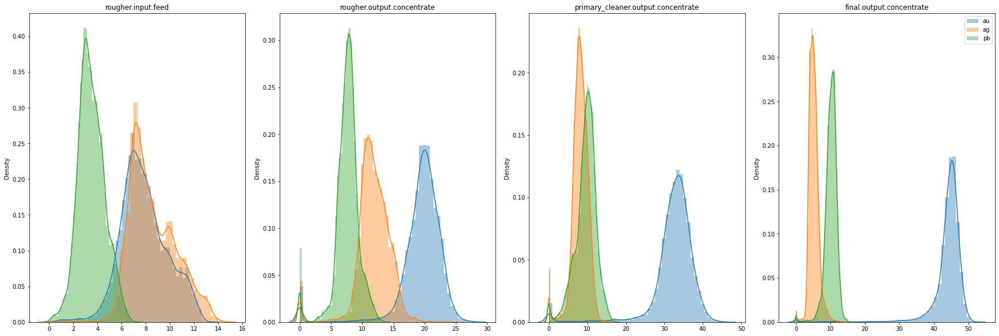

In [48]:
fig, axs = plt.subplots(1, len(stage_list), figsize=(24, 8), constrained_layout=True)

for stage, ax in zip(stage_list, axs):
    ax.set_title(stage)
    for metal in metals_list:        
        our_columns = df_train.columns.str.contains(stage+'_'+metal)
        sns_ax = sns.distplot(df_train.loc[:, our_columns].dropna(), label=metal, ax=ax)   
plt.legend()
plt.show()

Видим, что концентрация золота возрастает, ее распределение становится менее разбросанным, концентрации других металлов снижаются, их распределения тоже более плотно "собираются" возле 0.

Посмотрим, что происходит с концентрацией в "хвостах".

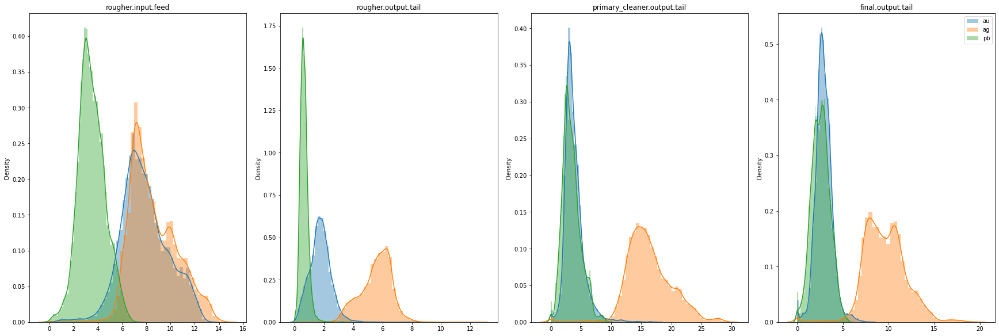

In [49]:
fig, axs = plt.subplots(1, 4, figsize=(24, 8), constrained_layout=True)

for tail, ax in zip(tails_list, axs):
    ax.set_title(tail)
    for metal in metals_list:        
        columns_list = df_train.columns.str.contains(tail+'_'+metal)
        sns_ax = sns.distplot(df_train.loc[:, columns_list].dropna(), label=metal, ax=ax)   
plt.legend()
plt.show()

Видим, что по мере продвижения по технологическому процессу концентрация золота в "хвостах" падает, концентрации других металлов меняются неоднозначно, но исследование изменения их концентраций не входит в задачи нашего исследования. 

"Перевернем" графики и посмотрим, как концентрации каждого из металлов изменяются в зависимости от стадий технологического процесса. 

В "выходах":

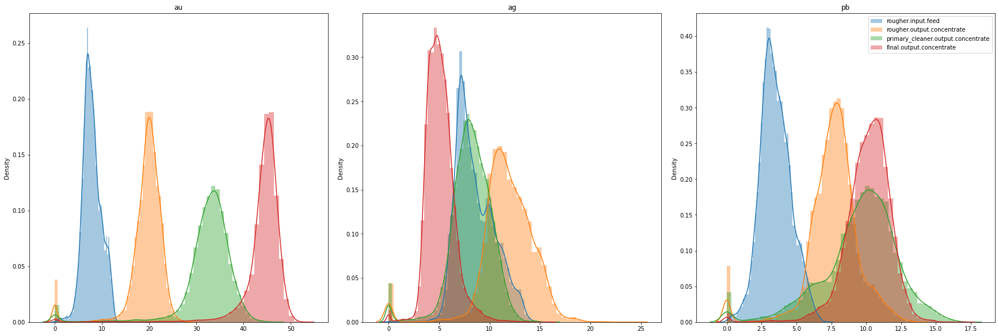

In [50]:
fig, axs = plt.subplots(1, len(metals_list), figsize=(24, 8), constrained_layout=True)

for metal, ax in zip(metals_list, axs):
    ax.set_title(metal)
    for stage in stage_list:
        our_columns = df_train.columns.str.contains(stage+'_'+metal)
        sns_ax = sns.distplot(df_train.loc[:, our_columns].dropna(), label=stage, ax=ax)   
plt.legend()
plt.show()

По мере продвижения по технологическому процессу концентрация золота возрастает, что очень явно видно на получившейся визуализации. 

В "хвостах":

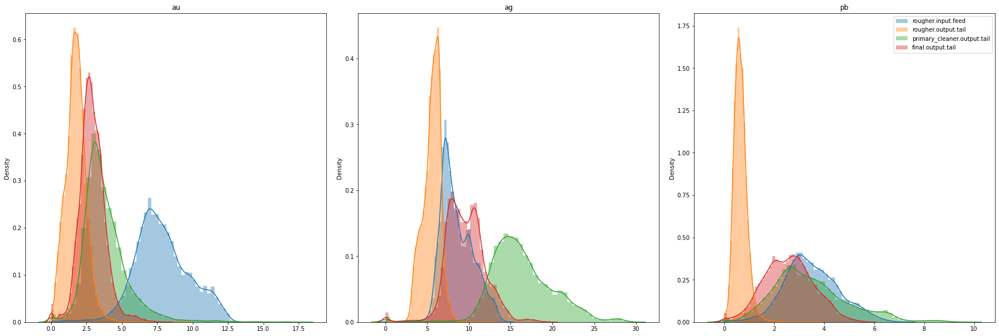

In [51]:
fig, axs = plt.subplots(1, len(metals_list), figsize=(24, 8), constrained_layout=True)
for metal, ax in zip(metals_list, axs):
    ax.set_title(metal)
    for tail in tails_list:
        our_columns = df_train.columns.str.contains(tail+'_'+metal)
        sns_ax = sns.distplot(df_train.loc[:, our_columns].dropna(), label=tail, ax=ax)   
plt.legend()
plt.show()

В "хвостах" концентрация золота тоже, в целом, снижается, но не однородно: в "хвосте" от флотации оказывается ниже, чем финальном "хвосте". Можно отдельно проверить гипотезу о равенстве средних в этих данных, но визуально напрашивается именно такой вывод. 

__Проверка распределения размеров гранул сырья__

Сравним распределения размеров гранул сырья на обучающей и тестовой выборках.

_(Примечание к входным данным и описанию технологического процесса: если распределения сильно отличаются друг от друга, оценка модели будет неправильной.)_

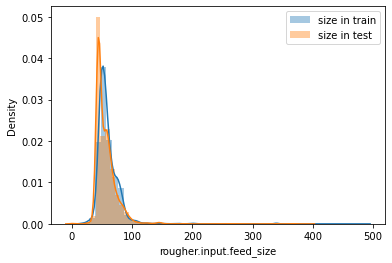

In [52]:
sns.distplot(df_train['rougher.input.feed_size'].dropna(), label='size in train')
sns.distplot(df_test['rougher.input.feed_size'].dropna(), label='size in test')
plt.legend()

Визуально распределения отличаются незначительно. Можно было бы выяснить, каковы средние размеры в выборках, но не у кого проконсультироваться, насколько эти различия существенны, т.к. у нас, к большому сожалению, нет возможности задать такие (или иные возникающие по ходу анализа вопросы) техническим специалистам заказчика анализа или подразделения нашей компании, если анализ делается для себя. 

__Суммарная концентрация всех веществ__

Исследуем суммарную концентрацию всех веществ на разных стадиях: в сырье, в черновом и финальном концентратах.

In [53]:
# stage_list = ['rougher.input.feed', 
#               'rougher.output.concentrate', 
#               'primary_cleaner.output.concentrate', 
#               'final.output.concentrate']
# tails_list = ['rougher.input.feed', 
#               'rougher.output.tail', 
#               'primary_cleaner.output.tail', 
#               'final.output.tail']
# metals_list = ['au', 'ag', 'pb']

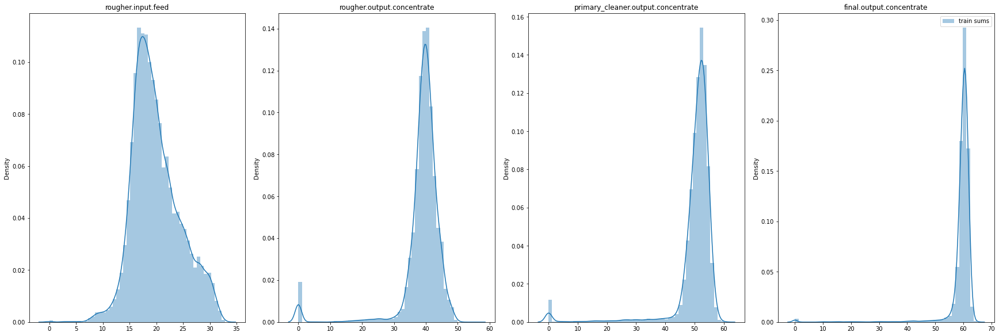

In [54]:
fig, axs = plt.subplots(1, len(stage_list), figsize=(24, 8), constrained_layout=True)

for stage, ax in zip(stage_list, axs):
    ax.set_title(stage)
    sum_train = df_train[stage+ '_ag'] + df_train[stage+ '_au'] + df_train[stage+ '_pb']
    sns.distplot(sum_train.dropna(), label='train sums', ax=ax) 
plt.legend()
plt.show()

Очевидно, что по мере продвижения по технологическому процессу суммарные концентрации возрастают, и практически исчезают значения "около 0", которые присутствуют в "выходах" флотации и первичной очистки. 

In [55]:
df_train[df_train['rougher.output.concentrate_ag']==0]['rougher.output.concentrate_ag'].value_counts()

0.0    297
Name: rougher.output.concentrate_ag, dtype: int64

In [56]:
df_train[df_train['rougher.output.concentrate_au']==0]['rougher.output.concentrate_au'].value_counts()

0.0    297
Name: rougher.output.concentrate_au, dtype: int64

In [57]:
df_train[df_train['rougher.output.concentrate_pb']==0]['rougher.output.concentrate_pb'].value_counts()

0.0    297
Name: rougher.output.concentrate_pb, dtype: int64

In [58]:
df_train[df_train['primary_cleaner.output.concentrate_ag']==0]['primary_cleaner.output.concentrate_ag'].value_counts()

0.0    74
Name: primary_cleaner.output.concentrate_ag, dtype: int64

In [59]:
df_train[df_train['primary_cleaner.output.concentrate_au']==0]['primary_cleaner.output.concentrate_au'].value_counts()

0.0    74
Name: primary_cleaner.output.concentrate_au, dtype: int64

In [60]:
df_train[df_train['primary_cleaner.output.concentrate_pb']==0]['primary_cleaner.output.concentrate_pb'].value_counts()

0.0    74
Name: primary_cleaner.output.concentrate_pb, dtype: int64

In [61]:
df_train[df_train['final.output.concentrate_ag']==0]['final.output.concentrate_ag'].value_counts()

0.0    58
Name: final.output.concentrate_ag, dtype: int64

In [62]:
df_train[df_train['final.output.concentrate_au']==0]['final.output.concentrate_au'].value_counts()

0.0    58
Name: final.output.concentrate_au, dtype: int64

In [63]:
df_train[df_train['final.output.concentrate_pb']==0]['final.output.concentrate_pb'].value_counts()

0.0    58
Name: final.output.concentrate_pb, dtype: int64

In [64]:
df_train.loc[df_train['rougher.output.concentrate_ag']==0, 'rougher.output.concentrate_ag'] = df_train['rougher.output.concentrate_ag'].median()
df_train.loc[df_train['rougher.output.concentrate_au']==0, 'rougher.output.concentrate_au'] = df_train['rougher.output.concentrate_au'].median()
df_train.loc[df_train['rougher.output.concentrate_pb']==0, 'rougher.output.concentrate_pb'] = df_train['rougher.output.concentrate_pb'].median()

df_train.loc[df_train['primary_cleaner.output.concentrate_ag']==0, 'primary_cleaner.output.concentrate_ag'] = df_train['primary_cleaner.output.concentrate_ag'].median()
df_train.loc[df_train['primary_cleaner.output.concentrate_au']==0, 'primary_cleaner.output.concentrate_au'] = df_train['primary_cleaner.output.concentrate_au'].median()
df_train.loc[df_train['primary_cleaner.output.concentrate_pb']==0, 'primary_cleaner.output.concentrate_pb'] = df_train['primary_cleaner.output.concentrate_pb'].median()

df_train.loc[df_train['final.output.concentrate_ag']==0, 'final.output.concentrate_ag'] = df_train['final.output.concentrate_ag'].median()
df_train.loc[df_train['final.output.concentrate_au']==0, 'final.output.concentrate_au'] = df_train['final.output.concentrate_au'].median()
df_train.loc[df_train['final.output.concentrate_pb']==0, 'final.output.concentrate_pb'] = df_train['final.output.concentrate_pb'].median()

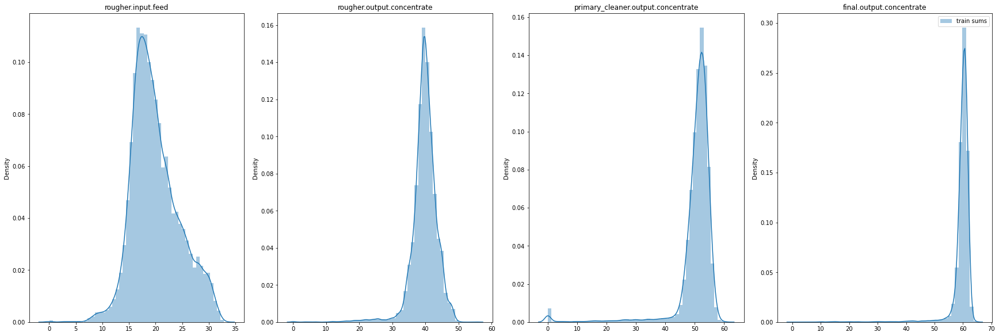

In [65]:
fig, axs = plt.subplots(1, len(stage_list), figsize=(24, 8), constrained_layout=True)

for stage, ax in zip(stage_list, axs):
    ax.set_title(stage)
    sum_train = df_train[stage+ '_ag'] + df_train[stage+ '_au'] + df_train[stage+ '_pb']
    sns.distplot(sum_train.dropna(), label='train sums', ax=ax) 
plt.legend()
plt.show()

## Построение, оценка и выбор модели ML

Для машинного обучения у нас есть датафреймы features_train_rougher, target_train_rougher, featurest_test_rougher и то же самое для этапа cleaner. В данных не заполнены пропуски и они не масштабированы. Категориальных данных среди них нет. 

Правильные ответы к features_test_rougher, features_test_cleaner сохранены в датасете test_answers.

### Rougher (Флотация)

In [66]:
features_train_rougher.head()

,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.feed_sol,rougher.input.feed_au,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_b_air,rougher.state.floatbank10_b_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_c_level,rougher.state.floatbank10_d_air,rougher.state.floatbank10_d_level,rougher.state.floatbank10_e_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level
date,,,,,,,,,,,,,,,,,,,,,,
2016-01-15 00:00:00,6.100378,2.284912,523.546326,55.486599,36.808594,6.486150,11.986616,6.007990,11.836743,6.005818,999.706909,-404.066986,1603.011353,-434.715027,1602.375000,-442.204468,1598.937256,-451.294128,1404.472046,-455.462982,1416.354980,-451.939636
2016-01-15 01:00:00,6.161113,2.266033,525.290581,57.278666,35.753385,6.478583,11.971193,6.005766,11.996163,6.012594,1000.286398,-400.065196,1600.754587,-449.953435,1600.479580,-449.830646,1600.527589,-449.953649,1399.227084,-450.869848,1399.719514,-450.119001
2016-01-15 02:00:00,6.116455,2.159622,530.026610,57.510649,35.971630,6.362222,11.920603,6.197377,11.920305,6.204633,999.719565,-400.074028,1599.337330,-450.008530,1599.672797,-449.954491,1599.849325,-449.954185,1399.180945,-449.937588,1400.316682,-450.527147
2016-01-15 03:00:00,6.043309,2.037807,542.590390,57.792734,36.862241,6.118189,11.630094,6.203177,11.692450,6.196578,999.814770,-400.200179,1600.059442,-450.619948,1600.012842,-449.910497,1597.725177,-450.130127,1400.943157,-450.030142,1400.234743,-449.790835
2016-01-15 04:00:00,6.060915,1.786875,540.531893,56.047189,34.347666,5.663707,10.957755,6.198826,10.960521,6.194897,999.678690,-399.752729,1600.208824,-449.599614,1600.357732,-450.034364,1599.759049,-449.909799,1401.560902,-448.877187,1401.160227,-450.407128


In [67]:
features_train_rougher.corr()

,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.feed_sol,rougher.input.feed_au,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_b_air,rougher.state.floatbank10_b_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_c_level,rougher.state.floatbank10_d_air,rougher.state.floatbank10_d_level,rougher.state.floatbank10_e_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level
rougher.input.feed_ag,1.000000,0.501849,-0.156550,-0.060062,0.130889,0.845670,0.130978,0.146999,0.109968,0.120722,0.336261,-0.029305,-0.132130,-0.085148,-0.178885,-0.077003,-0.186170,-0.079106,-0.099330,-0.075129,-0.111148,-0.074267
rougher.input.feed_pb,0.501849,1.000000,-0.184498,-0.034727,0.093159,0.701488,0.275383,0.017978,0.228720,0.001505,0.263085,0.295039,-0.250416,-0.102408,-0.243480,-0.092069,-0.329194,-0.091780,-0.326899,-0.094718,-0.299171,-0.093036
rougher.input.feed_rate,-0.156550,-0.184498,1.000000,0.058642,0.545754,-0.250031,0.067549,0.598491,0.316953,0.665075,-0.041550,-0.000235,-0.231052,-0.304987,-0.256520,-0.317662,-0.233856,-0.311482,-0.156841,-0.321404,-0.177886,-0.319160
rougher.input.feed_size,-0.060062,-0.034727,0.058642,1.000000,0.125174,-0.101685,-0.083747,0.082965,-0.228640,-0.055011,0.121778,0.216798,-0.065614,0.094360,-0.096623,0.101711,-0.094701,0.106787,-0.005518,0.096505,0.014663,0.091313
rougher.input.feed_sol,0.130889,0.093159,0.545754,0.125174,1.000000,0.082473,0.179999,0.324303,0.249779,0.319143,0.189851,0.271160,-0.200033,-0.156579,-0.217018,-0.147490,-0.257854,-0.147858,-0.216665,-0.150526,-0.210678,-0.149125
rougher.input.feed_au,0.845670,0.701488,-0.250031,-0.101685,0.082473,1.000000,0.291018,0.084073,0.215460,0.040847,0.240721,-0.013522,-0.110677,-0.036918,-0.120080,-0.031817,-0.161944,-0.032688,-0.143878,-0.030096,-0.163416,-0.027116
rougher.input.floatbank10_sulfate,0.130978,0.275383,0.067549,-0.083747,0.179999,0.291018,1.000000,-0.067064,0.796961,-0.131488,-0.172717,0.124654,0.057823,0.201365,0.092464,0.210874,0.027694,0.213018,-0.103293,0.204076,-0.078397,0.204799
rougher.input.floatbank10_xanthate,0.146999,0.017978,0.598491,0.082965,0.324303,0.084073,-0.067064,1.000000,0.005757,0.841914,0.118867,-0.068692,-0.101120,-0.354651,-0.165964,-0.361103,-0.120325,-0.357194,0.031956,-0.356391,0.011293,-0.355938
rougher.input.floatbank11_sulfate,0.109968,0.228720,0.316953,-0.228640,0.249779,0.215460,0.796961,0.005757,1.000000,0.214951,-0.200493,0.034525,-0.109240,-0.073605,-0.065184,-0.072974,-0.116265,-0.065440,-0.224971,-0.076587,-0.232565,-0.077229
rougher.input.floatbank11_xanthate,0.120722,0.001505,0.665075,-0.055011,0.319143,0.040847,-0.131488,0.841914,0.214951,1.000000,0.049516,-0.131925,-0.221673,-0.493167,-0.258853,-0.503663,-0.215238,-0.496472,-0.082756,-0.498994,-0.130110,-0.500697


array([[<AxesSubplot:xlabel='rougher.input.feed_ag', ylabel='rougher.input.feed_ag'>,
        <AxesSubplot:xlabel='rougher.input.feed_pb', ylabel='rougher.input.feed_ag'>,
        <AxesSubplot:xlabel='rougher.input.feed_rate', ylabel='rougher.input.feed_ag'>,
        <AxesSubplot:xlabel='rougher.input.feed_size', ylabel='rougher.input.feed_ag'>,
        <AxesSubplot:xlabel='rougher.input.feed_sol', ylabel='rougher.input.feed_ag'>,
        <AxesSubplot:xlabel='rougher.input.feed_au', ylabel='rougher.input.feed_ag'>,
        <AxesSubplot:xlabel='rougher.input.floatbank10_sulfate', ylabel='rougher.input.feed_ag'>,
        <AxesSubplot:xlabel='rougher.input.floatbank10_xanthate', ylabel='rougher.input.feed_ag'>,
        <AxesSubplot:xlabel='rougher.input.floatbank11_sulfate', ylabel='rougher.input.feed_ag'>,
        <AxesSubplot:xlabel='rougher.input.floatbank11_xanthate', ylabel='rougher.input.feed_ag'>,
        <AxesSubplot:xlabel='rougher.state.floatbank10_a_air', ylabel='rougher.input.

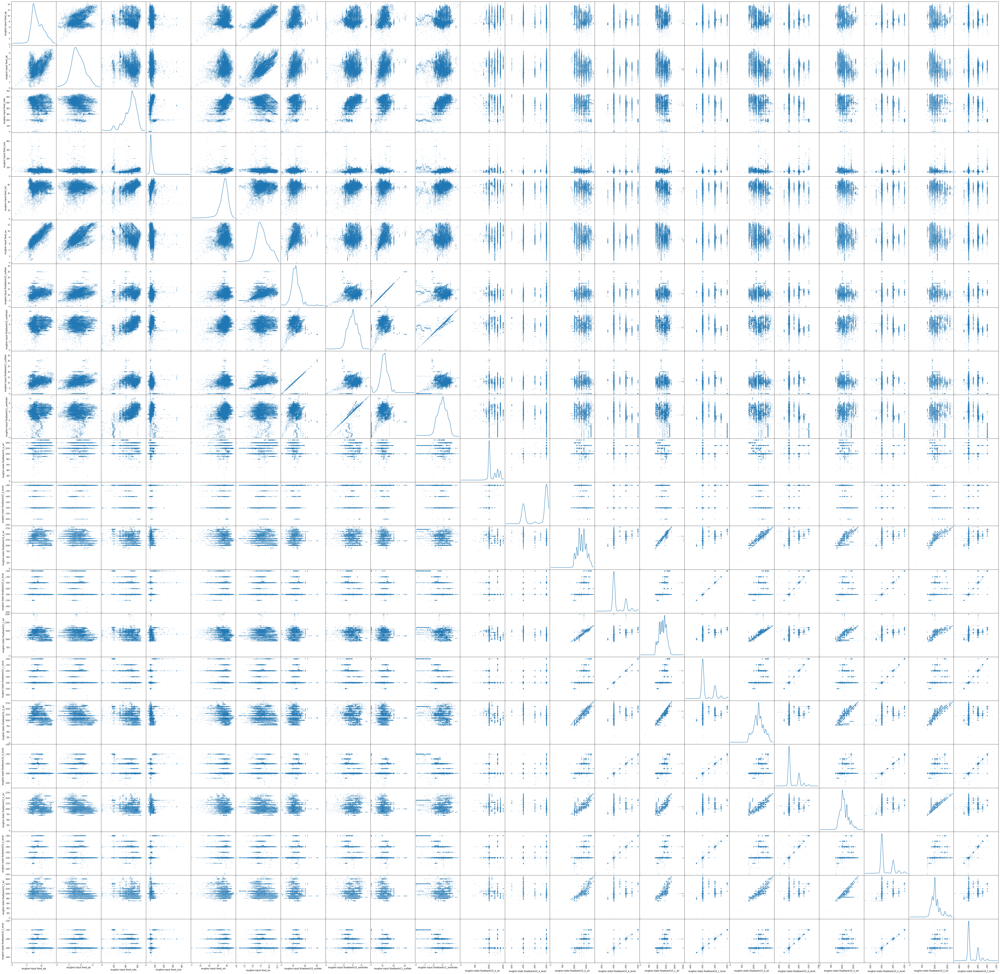

In [68]:
scatter_matrix(features_train_rougher, alpha=0.2, figsize=(80, 80), diagonal='kde')

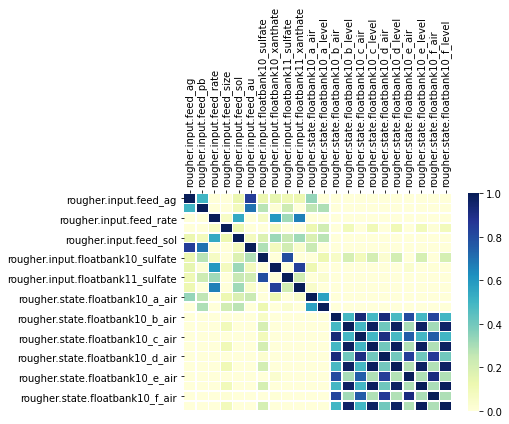

In [69]:
corr_r=features_train_rougher.corr()
ax = sns.heatmap(data=corr_r, annot=False, cmap="YlGnBu", linewidths=.3, vmin=0, vmax=1);
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_tick_params(rotation=90)

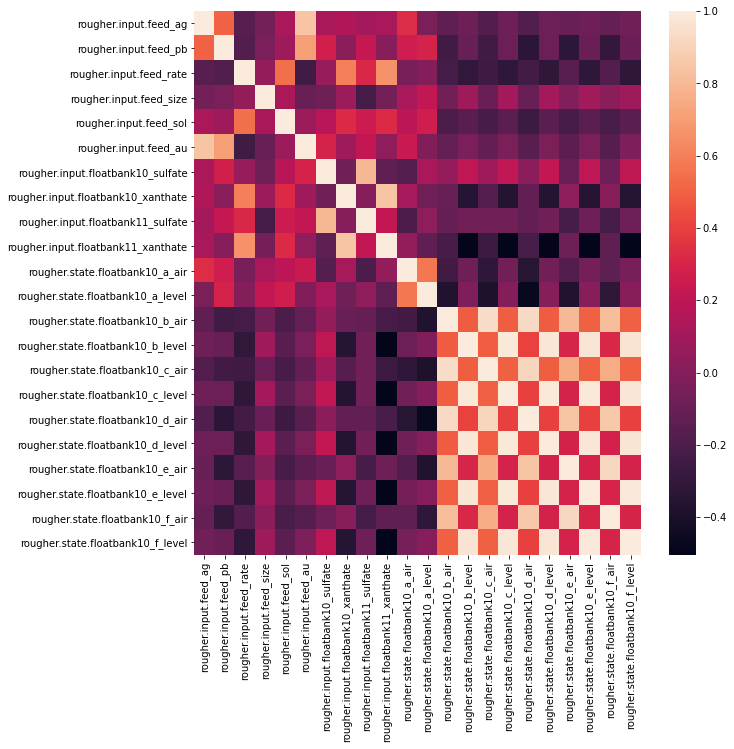

In [70]:
plt.rcParams['figure.figsize']=(10,10)
sns.heatmap(features_train_rougher.corr())
plt.show()

scatter_matrix, heatmap показывают, что есть корреляции, близкие к 1, среди параметров floatbank (air), судя по scatter_matrix, они даже имеют вид линейной функции. В нижнем правом углу видим эту "сетку".

С одной стороны, мультиколлинеарность плохо влияет на модель, с другой стороны в версии проекта до этой редакции мы применяли Lasso регрессию, но она не дала лучшие результаты, чем RandomForestRegressor, хотя должна была бы при мультиколлинеарности факторов.


Тем не менее, в конечном итоге и с сохранением этих параметров, и с удалением этих параметров мы получили модель RandomForestRegressor, которая была хуже, чем DummyRegressor, судя по расчету метрики SMAPE. 


Мы можем воспользоваться закомментированным кодом ниже, чтобы удалить "сетку" взаимозависимых параметров, но в процессе проверки мы обнаружили, что это повлияет на итоговую метрику с ее уменьшением менее, чем на 1%.

In [71]:
# features_train_rougher = features_train_rougher.drop(['rougher.state.floatbank10_c_air',
#     'rougher.state.floatbank10_c_level', 
#      'rougher.state.floatbank10_d_air', 
#      'rougher.state.floatbank10_d_level', 
#      'rougher.state.floatbank10_e_air', 
#      'rougher.state.floatbank10_e_level', 
#      'rougher.state.floatbank10_f_air', 
#      'rougher.state.floatbank10_f_level'], axis=1)

In [72]:
# features_train_rougher.info()

In [73]:
# plt.rcParams['figure.figsize']=(10,10)
# sns.heatmap(features_train_rougher.corr())
# plt.show()

In [74]:
features_train_rougher, features_valid_rougher, target_train_rougher, target_valid_rougher = train_test_split(
    features_train_rougher, target_train_rougher, test_size=0.25, random_state=12345)
print(features_train_rougher.shape, features_valid_rougher.shape, target_train_rougher.shape, target_valid_rougher.shape)

(10611, 22) (3538, 22) (10611,) (3538,)


In [75]:
features_train_rougher_names=list(features_train_rougher.columns)

In [76]:
scaler = StandardScaler()
scaler.fit(features_train_rougher)
features_train_rougher = scaler.transform(features_train_rougher)
features_valid_rougher = scaler.transform(features_valid_rougher)

__LinearRegression__

In [77]:
LinearRegression().get_params().keys()

dict_keys(['copy_X', 'fit_intercept', 'n_jobs', 'normalize', 'positive'])

In [78]:
lr_model=LinearRegression(fit_intercept=True, n_jobs=-1, normalize=True)
lr_model.fit(features_train_rougher, target_train_rougher) 

LinearRegression(n_jobs=-1, normalize=True)

In [79]:
predictions_valid_rougher_lr = lr_model.predict(features_valid_rougher)

Проверим метрику sMAPE (Symmetric Mean Absolute Percentage Error, «симметричное среднее абсолютное процентное отклонение»), которую мы должны использовать в этом исследовании.

In [80]:
def smape_func(a, f):
    return 1/len(a) * np.sum(2 * np.abs(f-a) / (np.abs(a) + np.abs(f))*100)

In [81]:
actual = target_valid_rougher
forecast = predictions_valid_rougher_lr

smape_rougher_lr=smape_func(actual, forecast)
smape_rougher_lr

10.897737204923608

Эта метрика показывает, какой процент составляет ошибка от среднего между фактическим и предсказанными значениями.

Посмотрим, какой результат дадут другие модели. 

### RandomForestRegressor

In [82]:
# scaler = StandardScaler()
# scaler.fit(features_train_rougher)
# features_train_rougher = scaler.transform(features_train_rougher)
# features_valid_rougher = scaler.transform(features_valid_rougher)

In [83]:
rfr_model=RandomForestRegressor()

In [84]:
rfr_model.get_params().keys()

dict_keys(['bootstrap', 'ccp_alpha', 'criterion', 'max_depth', 'max_features', 'max_leaf_nodes', 'max_samples', 'min_impurity_decrease', 'min_impurity_split', 'min_samples_leaf', 'min_samples_split', 'min_weight_fraction_leaf', 'n_estimators', 'n_jobs', 'oob_score', 'random_state', 'verbose', 'warm_start'])

In [85]:
my_scorer =  make_scorer(smape_func, greater_is_better=False)
parametrs = {'bootstrap': [True], 
              'criterion': ['mse', 'poisson'],
              'max_depth': [3,5,9,11,15],
              'min_samples_leaf': [3,5,7],
              'min_samples_split': [1,2,4],
              'n_estimators': [10,50,100],
              'n_jobs': [-1]
             }

In [86]:
# %%time
# GSCV=GridSearchCV(rfr_model, parametrs, cv=5, n_jobs=-1, scoring=my_scorer)
# GSCV.fit(features_train_rougher, target_train_rougher)
# GSCV.best_params_

Получив следующие параметры, применим их к нашей модели. 

Wall time: 7min 29s 
{'bootstrap': True,
 'criterion': 'mse',
 'max_depth': 15,
 'min_samples_leaf': 3,
 'min_samples_split': 2,
 'n_estimators': 100,
 'n_jobs': -1}

In [87]:
rfr_model_rougher=RandomForestRegressor(random_state=12345,
    bootstrap=True, 
    criterion='mse',
    max_depth=15,
    min_samples_leaf=3,
    min_samples_split=2,
    n_estimators=100,
    n_jobs=-1)
rfr_model_rougher.fit(features_train_rougher, target_train_rougher)

RandomForestRegressor(max_depth=15, min_samples_leaf=3, n_jobs=-1,
                      random_state=12345)

In [88]:
predictions_valid_rougher_rfr = rfr_model_rougher.predict(features_valid_rougher)
predictions_valid_rougher_rfr

array([82.64001104, 79.13362393, 88.06276911, ..., 78.90000762,
       85.38532139, 91.83179085])

In [89]:
actual = target_valid_rougher
forecast = predictions_valid_rougher_rfr

smape_rfr_rougher=smape_func(actual, forecast)
smape_rfr_rougher

8.942884001592123

In [90]:
feature_importances_df_r=pd.DataFrame({'features':features_train_rougher_names, 'feature_importances': rfr_model_rougher.feature_importances_})
feature_importances_df_r.sort_values(by='feature_importances', ascending=False)

,features,feature_importances
8,rougher.input.floatbank11_sulfate,0.109817
0,rougher.input.feed_ag,0.106478
7,rougher.input.floatbank10_xanthate,0.082272
6,rougher.input.floatbank10_sulfate,0.069018
11,rougher.state.floatbank10_a_level,0.062665
2,rougher.input.feed_rate,0.058791
9,rougher.input.floatbank11_xanthate,0.058554
16,rougher.state.floatbank10_d_air,0.053373
4,rougher.input.feed_sol,0.046649
1,rougher.input.feed_pb,0.043149


Показатели SMAPE у RandomForestRegressor лучше, чем у линейной регрессии - на валидационной выборке.

__Lasso__

In [91]:
lasso = Lasso(alpha=0.021544346900318832, copy_X=True, fit_intercept=True,
        max_iter=1000, normalize=False, positive=False, precompute=False,
        random_state=21, selection='cyclic', tol=0.0001, warm_start=False)
lasso.fit(features_train_rougher, target_train_rougher)
predictions_valid_rougher_lasso = lasso.predict(features_valid_rougher)

In [92]:
actual = target_valid_rougher
forecast = predictions_valid_rougher_lasso

smape_lasso_rougher=smape_func(actual, forecast)
smape_lasso_rougher

10.887549652850481

Показатели smape у регрессии Lasso хуже, чем у RFR.

### Cleaner (очистка)

Перейдем к этапу очистки.

In [93]:
features_train_cleaner.corr()

,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
primary_cleaner.input.sulfate,1.000000,0.485962,0.166644,0.262104,0.028862,-0.013215,0.049567,-0.026992,0.049639,0.000195,0.107401,-0.018981,0.130925,0.103571,0.136957,0.123705,0.083614,-0.011200,0.005108,-0.039764,0.088433,0.032400,0.111656,-0.063357,-0.005323,-0.029537,0.001143,-0.024067,-0.103191,-0.140987
primary_cleaner.input.depressant,0.485962,1.000000,0.164423,0.280443,-0.136513,0.138719,-0.099315,0.142976,-0.110456,0.158957,-0.088083,0.065819,-0.059417,0.186396,0.073193,0.178569,-0.173230,-0.077607,0.014830,0.014074,-0.234691,-0.159930,-0.136181,-0.264924,-0.259662,-0.157576,-0.221977,-0.152958,-0.172111,-0.121435
primary_cleaner.input.feed_size,0.166644,0.164423,1.000000,-0.010395,-0.130437,0.079695,-0.129726,0.081212,-0.154343,0.080218,-0.197977,0.070927,-0.173746,0.103736,-0.133033,0.082897,-0.153010,0.096497,0.012768,0.134397,-0.326453,0.112643,-0.247270,0.019955,-0.226747,0.126726,-0.213826,0.127440,0.141257,0.059152
primary_cleaner.input.xanthate,0.262104,0.280443,-0.010395,1.000000,0.075293,0.036713,0.103430,0.021844,0.070043,0.034270,0.115394,-0.035130,-0.084337,-0.087945,-0.012675,-0.080006,0.037708,-0.248330,-0.072279,-0.106675,0.037259,-0.213643,0.007349,-0.323638,-0.080596,-0.203777,-0.094743,-0.201504,-0.219412,-0.074515
primary_cleaner.state.floatbank8_a_air,0.028862,-0.136513,-0.130437,0.075293,1.000000,0.164839,0.945315,0.164752,0.934515,0.173565,0.320781,0.067993,0.257785,-0.057199,0.243760,-0.034275,0.455573,0.296810,0.323693,0.040481,0.537343,0.325732,0.509748,0.216565,0.542920,0.251741,0.491135,0.240972,0.300826,0.052801
primary_cleaner.state.floatbank8_a_level,-0.013215,0.138719,0.079695,0.036713,0.164839,1.000000,0.125218,0.958855,0.155518,0.958372,-0.402513,0.691281,0.155762,0.184698,0.228211,0.164186,0.011491,0.074928,0.226707,0.170046,-0.038089,0.052895,0.095066,-0.047441,0.012458,0.106996,0.068357,0.074077,0.175184,0.178493
primary_cleaner.state.floatbank8_b_air,0.049567,-0.099315,-0.129726,0.103430,0.945315,0.125218,1.000000,0.139506,0.939614,0.147853,0.328473,0.040957,0.202216,-0.082509,0.209107,-0.054418,0.435080,0.306620,0.294532,0.037753,0.518057,0.338018,0.506040,0.189905,0.542611,0.257029,0.477255,0.248809,0.301977,0.030374
primary_cleaner.state.floatbank8_b_level,-0.026992,0.142976,0.081212,0.021844,0.164752,0.958855,0.139506,1.000000,0.156547,0.938447,-0.435867,0.702946,0.140949,0.195215,0.217128,0.173143,-0.016158,0.084859,0.214559,0.185536,-0.069274,0.062995,0.077644,-0.033285,-0.011293,0.120204,0.044913,0.088185,0.169495,0.188251
primary_cleaner.state.floatbank8_c_air,0.049639,-0.110456,-0.154343,0.070043,0.934515,0.155518,0.939614,0.156547,1.000000,0.165592,0.346634,0.063505,0.275060,-0.084915,0.287404,-0.058101,0.471898,0.281914,0.343213,-0.006399,0.576251,0.319083,0.575169,0.208054,0.577239,0.21820

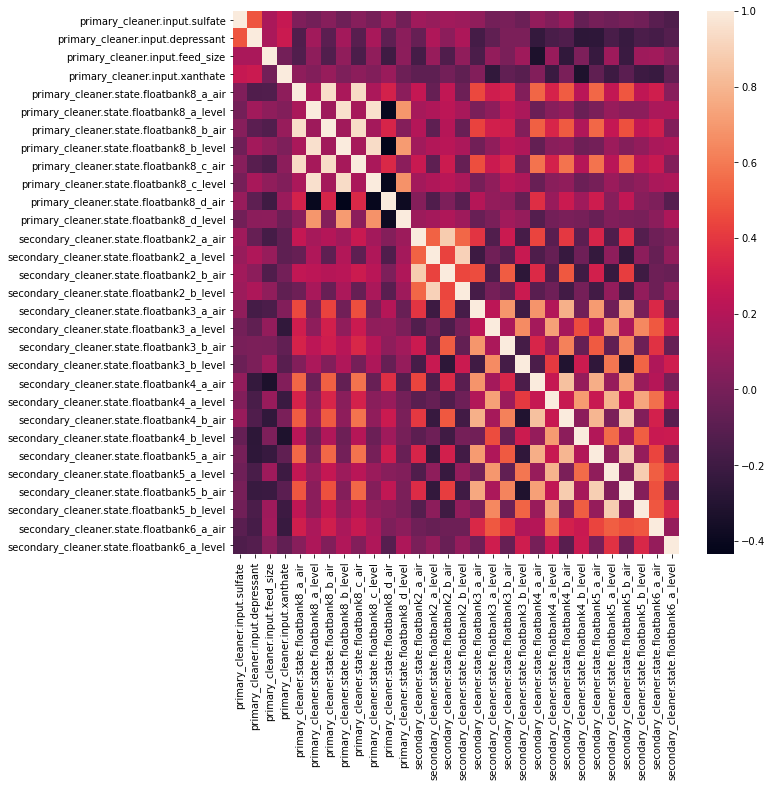

In [94]:
plt.rcParams['figure.figsize']=(10,10)
sns.heatmap(features_train_cleaner.corr())
plt.show()

Видим более светлое "пятно" корреляция в данных air флотационных установок, но удалять эти данные не будем.

In [95]:
features_train_cleaner, features_valid_cleaner, target_train_cleaner, target_valid_cleaner = train_test_split(
    features_train_cleaner, target_train_cleaner, test_size=0.25, random_state=12345)
print(features_train_cleaner.shape, features_valid_cleaner.shape, target_train_cleaner.shape, target_valid_cleaner.shape)

(10611, 30) (3538, 30) (10611,) (3538,)


In [96]:
features_train_cleaner_names=list(features_train_cleaner.columns)

In [97]:
scaler = StandardScaler()
scaler.fit(features_train_cleaner)
features_train_cleaner = scaler.transform(features_train_cleaner)
features_valid_cleaner = scaler.transform(features_valid_cleaner)

__Linear Regression__

In [98]:
lr_model=LinearRegression(fit_intercept=True, n_jobs=-1, normalize=True)
lr_model.fit(features_train_cleaner, target_train_cleaner) 
predictions_valid_cleaner_lr = lr_model.predict(features_valid_cleaner)

In [99]:
actual = target_valid_cleaner
forecast = predictions_valid_cleaner_lr

smape_cleaner_lr=smape_func(actual, forecast)
smape_cleaner_lr

9.024910355264222

__RFR__

In [100]:
rfr_model=RandomForestRegressor()
my_scorer =  make_scorer(smape_func, greater_is_better=False)
parametrs = {'bootstrap': [True], 
              'criterion': ['mse', 'poisson'],
              'max_depth': [3,5,9,11,15],
              'min_samples_leaf': [3,5,7],
              'min_samples_split': [1,2,4],
              'n_estimators': [10,50,100],
              'n_jobs': [-1]
             }

In [101]:
# %%time
# GSCV=GridSearchCV(rfr_model, parametrs, cv=5, n_jobs=-1, scoring=my_scorer)
# GSCV.fit(features_train_cleaner, target_train_cleaner)
# GSCV.best_params_

In [102]:
rfr_model_cleaner=RandomForestRegressor(random_state=12345,
    bootstrap=True, 
    criterion='mse',
    max_depth=15,
    min_samples_leaf=3,
    min_samples_split=4,
    n_estimators=100,
    n_jobs=-1)
rfr_model_cleaner.fit(features_train_cleaner, target_train_cleaner)
predictions_valid_cleaner_rfr = rfr_model_cleaner.predict(features_valid_cleaner)

In [103]:
feature_importances_df_cl=pd.DataFrame({'features':features_train_cleaner_names, 'feature_importances': rfr_model_cleaner.feature_importances_})
feature_importances_df_cl.sort_values(by='feature_importances', ascending=False)

,features,feature_importances
0,primary_cleaner.input.sulfate,0.252872
22,secondary_cleaner.state.floatbank4_b_air,0.059242
12,secondary_cleaner.state.floatbank2_a_air,0.048907
1,primary_cleaner.input.depressant,0.048152
16,secondary_cleaner.state.floatbank3_a_air,0.046202
3,primary_cleaner.input.xanthate,0.035187
28,secondary_cleaner.state.floatbank6_a_air,0.034969
20,secondary_cleaner.state.floatbank4_a_air,0.033563
14,secondary_cleaner.state.floatbank2_b_air,0.032482
24,secondary_cleaner.state.floatbank5_a_air,0.029224


In [104]:
actual = target_valid_cleaner
forecast = predictions_valid_cleaner_rfr

smape_rfr_cleaner=smape_func(actual, forecast)
smape_rfr_cleaner

6.739706307062623

__Lasso__

In [105]:
lasso = Lasso(alpha=0.021544346900318832, copy_X=True, fit_intercept=True,
        max_iter=1000, normalize=False, positive=False, precompute=False,
        random_state=21, selection='cyclic', tol=0.0001, warm_start=False)
lasso.fit(features_train_rougher, target_train_rougher)
lasso.fit(features_train_cleaner, target_train_cleaner)
predictions_valid_cleaner_lasso = lasso.predict(features_valid_cleaner)

In [106]:
actual = target_valid_cleaner
forecast = predictions_valid_cleaner_lasso

smape_lasso_cleaner=smape_func(actual, forecast)
smape_lasso_cleaner

9.003166720031988

In [107]:
def smape_func_result(smape_rougher, smape_cleaner):
    SMAPE = 0.25*smape_rougher + 0.75*smape_cleaner
    return SMAPE

__SMAPE - Linear Regression__

In [108]:
smape_func_result(smape_rougher_lr, smape_cleaner_lr)

9.49311706767907

__SMAPE - Random Forest Regressor__

In [109]:
smape_func_result(smape_rfr_rougher, smape_rfr_cleaner)

7.2905007306949985

__SMAPE - Lasso__

In [110]:
smape_func_result(smape_lasso_rougher, smape_lasso_cleaner)

9.474262453236612

Согласно итоговой SMAPE на валидационной выборке лучшая модель - __Random Forest Regressor__. 

Проверим ее на тестовой выборке. Правильные ответы в датасете test_answers. 

### Проверка качества модели на тестовой выборке

In [111]:
# features_test_rougher = features_test_rougher.drop(['rougher.state.floatbank10_c_air',
#     'rougher.state.floatbank10_c_level', 
#      'rougher.state.floatbank10_d_air', 
#      'rougher.state.floatbank10_d_level', 
#      'rougher.state.floatbank10_e_air', 
#      'rougher.state.floatbank10_e_level', 
#      'rougher.state.floatbank10_f_air', 
#      'rougher.state.floatbank10_f_level'], axis=1)

In [112]:
scaler_rougher = StandardScaler()
scaler_rougher.fit(features_test_rougher)
features_test_rougher = scaler_rougher.transform(features_test_rougher)

In [113]:
scaler_cleaner = StandardScaler()
scaler_cleaner.fit(features_test_cleaner)
features_test_cleaner = scaler_cleaner.transform(features_test_cleaner)

In [114]:
rfr_model_rougher_final=RandomForestRegressor(random_state=12345,
    bootstrap=True, 
    criterion='mse',
    max_depth=15,
    min_samples_leaf=3,
    min_samples_split=4,
    n_estimators=100,
    n_jobs=-1)
rfr_model_rougher_final.fit(features_train_rougher, target_train_rougher)

RandomForestRegressor(max_depth=15, min_samples_leaf=3, min_samples_split=4,
                      n_jobs=-1, random_state=12345)

In [115]:
rougher_predictions=pd.Series(rfr_model_rougher_final.predict(features_test_rougher))
rougher_predictions

0       86.564729
1       86.981883
2       87.505852
3       88.153107
4       87.793441
          ...    
5285    56.140956
5286    70.468462
5287    62.934930
5288    64.084132
5289    73.170425
Length: 5290, dtype: float64

In [116]:
feature_importances_df_r=pd.DataFrame({'features':features_train_rougher_names, 'feature_importances': rfr_model_rougher_final.feature_importances_})
feature_importances_df_r.sort_values(by='feature_importances', ascending=False)

,features,feature_importances
8,rougher.input.floatbank11_sulfate,0.109817
0,rougher.input.feed_ag,0.106478
7,rougher.input.floatbank10_xanthate,0.082272
6,rougher.input.floatbank10_sulfate,0.069018
11,rougher.state.floatbank10_a_level,0.062665
2,rougher.input.feed_rate,0.058791
9,rougher.input.floatbank11_xanthate,0.058554
16,rougher.state.floatbank10_d_air,0.053373
4,rougher.input.feed_sol,0.046649
1,rougher.input.feed_pb,0.043149


In [117]:
actual = test_answers['rougher.output.recovery']
forecast = rfr_model_rougher_final.predict(features_test_rougher)
smape_rougher_test=smape_func(actual, forecast)
smape_rougher_test

11.989673746369162

In [118]:
rfr_model_cleaner_final=RandomForestRegressor(
    bootstrap=True, 
    criterion='mse',
    max_depth=15,
    min_samples_leaf=5,
    min_samples_split=4,
    n_estimators=100,
    n_jobs=-1)
rfr_model_cleaner_final.fit(features_train_cleaner, target_train_cleaner)

RandomForestRegressor(max_depth=15, min_samples_leaf=5, min_samples_split=4,
                      n_jobs=-1)

In [119]:
cleaner_predictions=pd.Series(rfr_model_cleaner_final.predict(features_test_cleaner))
cleaner_predictions

0       66.272266
1       65.070824
2       66.409543
3       63.951330
4       63.990661
          ...    
5285    54.008319
5286    70.348627
5287    75.454819
5288    76.045956
5289    77.930074
Length: 5290, dtype: float64

In [120]:
feature_importances_df_cl=pd.DataFrame({'features':features_train_cleaner_names, 'feature_importances': rfr_model_cleaner_final.feature_importances_})
feature_importances_df_cl.sort_values(by='feature_importances', ascending=False)
feature_importances_df_cl.sort_values(by='feature_importances', ascending=False).head(10)

,features,feature_importances
0,primary_cleaner.input.sulfate,0.270007
22,secondary_cleaner.state.floatbank4_b_air,0.067328
12,secondary_cleaner.state.floatbank2_a_air,0.049148
1,primary_cleaner.input.depressant,0.048584
16,secondary_cleaner.state.floatbank3_a_air,0.045665
3,primary_cleaner.input.xanthate,0.036622
28,secondary_cleaner.state.floatbank6_a_air,0.036518
20,secondary_cleaner.state.floatbank4_a_air,0.031945
14,secondary_cleaner.state.floatbank2_b_air,0.030340
24,secondary_cleaner.state.floatbank5_a_air,0.029990


In [121]:
actual = test_answers['final.output.recovery']
forecast = rfr_model_cleaner_final.predict(features_test_cleaner)

smape_cleaner_test=smape_func(actual, forecast)
smape_cleaner_test

11.92971798517906

In [122]:
smape_func_result(smape_rougher_test, smape_cleaner_test)

11.944706925476586

Мы получили итоговое значение SMAPE с помощью модели RandomForestRegressor на тестовых данных. 

_SMAPE (RandomForestRegressor), test = 11.330072077169374 в случае, если мы удалим мультиколлинеарные факторы, которые мы нашли ранее_

__Dummy Regressor__

In [123]:
d_model=DummyRegressor(strategy='median', quantile=None)

_Rougher_

In [124]:
d_model.fit(features_train_rougher, target_train_rougher)

DummyRegressor(strategy='median')

In [125]:
actual = test_answers['rougher.output.recovery']
forecast = d_model.predict(features_test_rougher)

smape_rougher_test_dummy=smape_func(actual, forecast)
smape_rougher_test_dummy

8.617673225725978

_Cleaner_

In [126]:
d_model.fit(features_train_cleaner, target_train_cleaner)

DummyRegressor(strategy='median')

In [127]:
actual = test_answers['final.output.recovery']
forecast = d_model.predict(features_test_cleaner)

smape_cleaner_test_dummy=smape_func(actual, forecast)
smape_cleaner_test_dummy

9.777342873767566

In [128]:
smape_func_result(smape_rougher_test_dummy, smape_cleaner_test_dummy)

9.48742546175717

Мы получили итоговое значение SMAPE для DummyRegression на тестовых данных, и оно лучше, чем для RandomForestRegressor. 

Соберем датасет из правильных ответов, предсказаний и модулей отклонений, чтобы посмотреть на их распределение. 

Соберем датасет из правильных ответов, предсказаний и модулей отклонений. 

In [129]:
test_answers=test_answers.reset_index()

In [132]:
test_answers.drop(['date'], axis=1)
test_answers.head()

,date,rougher.output.recovery,final.output.recovery
0,2016-09-01 00:59:59,89.993421,70.273583
1,2016-09-01 01:59:59,88.089657,68.910432
2,2016-09-01 02:59:59,88.412756,68.143213
3,2016-09-01 03:59:59,87.360133,67.776393
4,2016-09-01 04:59:59,83.236367,61.467078


In [133]:
test_answers['rougher_predictions']=rougher_predictions

In [134]:
test_answers['cleaner_predictions']=cleaner_predictions

In [135]:
test_answers

,date,rougher.output.recovery,final.output.recovery,rougher_predictions,cleaner_predictions
0,2016-09-01 00:59:59,89.993421,70.273583,86.564729,66.272266
1,2016-09-01 01:59:59,88.089657,68.910432,86.981883,65.070824
2,2016-09-01 02:59:59,88.412756,68.143213,87.505852,66.409543
3,2016-09-01 03:59:59,87.360133,67.776393,88.153107,63.951330
4,2016-09-01 04:59:59,83.236367,61.467078,87.793441,63.990661
...,...,...,...,...,...
5285,2017-12-31 19:59:59,95.172585,68.919891,56.140956,54.008319
5286,2017-12-31 20:59:59,94.575036,68.440582,70.468462,70.348627
5287,2017-12-31 21:59:59,93.018138,67.092759,62.934930,75.454819
5288,2017-12-31 22:59:59,92.599042,68.061186,64.084132,76.045956


In [136]:
test_answers['rougher_difference']=abs(test_answers['rougher.output.recovery']-test_answers['rougher_predictions'])
test_answers['cleaner_difference']=abs(test_answers['final.output.recovery']-test_answers['cleaner_predictions'])
test_answers

,date,rougher.output.recovery,final.output.recovery,rougher_predictions,cleaner_predictions,rougher_difference,cleaner_difference
0,2016-09-01 00:59:59,89.993421,70.273583,86.564729,66.272266,3.428692,4.001317
1,2016-09-01 01:59:59,88.089657,68.910432,86.981883,65.070824,1.107774,3.839608
2,2016-09-01 02:59:59,88.412756,68.143213,87.505852,66.409543,0.906903,1.733670
3,2016-09-01 03:59:59,87.360133,67.776393,88.153107,63.951330,0.792974,3.825063
4,2016-09-01 04:59:59,83.236367,61.467078,87.793441,63.990661,4.557074,2.523583
...,...,...,...,...,...,...,...
5285,2017-12-31 19:59:59,95.172585,68.919891,56.140956,54.008319,39.031629,14.911571
5286,2017-12-31 20:59:59,94.575036,68.440582,70.468462,70.348627,24.106574,1.908045
5287,2017-12-31 21:59:59,93.018138,67.092759,62.934930,75.454819,30.083209,8.362060
5288,2017-12-31 22:59:59,92.599042,68.061186,64.084132,76.045956,28.514911,7.984769


array([[<AxesSubplot:title={'center':'rougher.output.recovery'}>,
        <AxesSubplot:title={'center':'final.output.recovery'}>],
       [<AxesSubplot:title={'center':'rougher_predictions'}>,
        <AxesSubplot:title={'center':'cleaner_predictions'}>],
       [<AxesSubplot:title={'center':'rougher_difference'}>,
        <AxesSubplot:title={'center':'cleaner_difference'}>]],
      dtype=object)

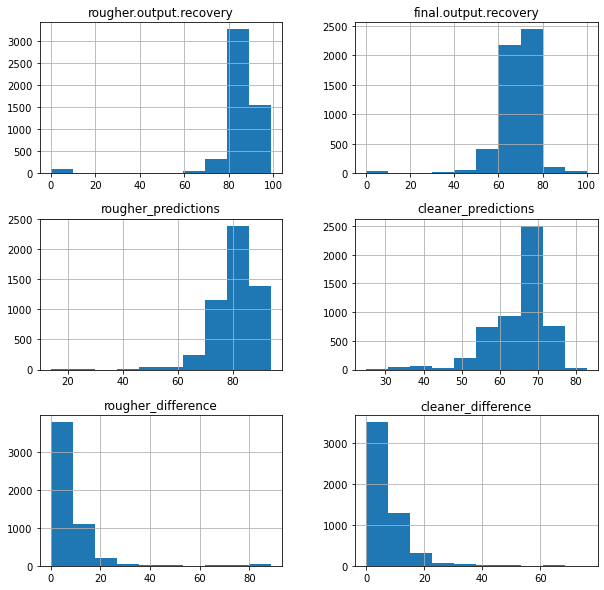

In [137]:
test_answers.hist()

На первый взгляд наши ошибки распределены около 0, но в них, согласно данным ниже, присутствуют выбросы - существенные значения отклонений, практически достигающих среднего значений предсказываемых величин. 

<AxesSubplot:>

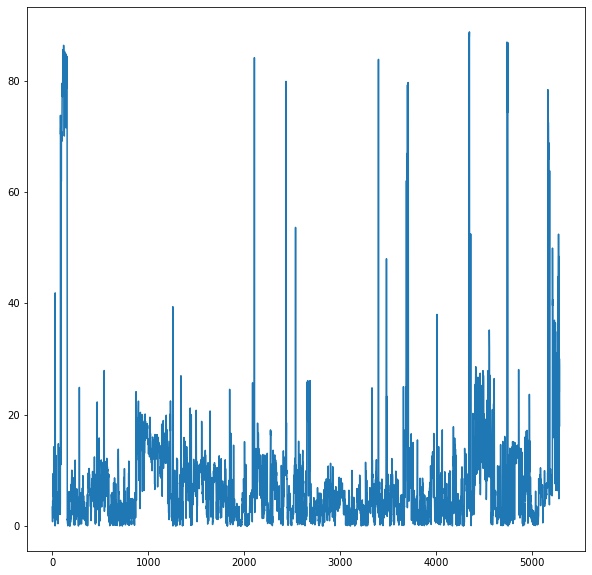

In [138]:
test_answers['rougher_difference'].plot()

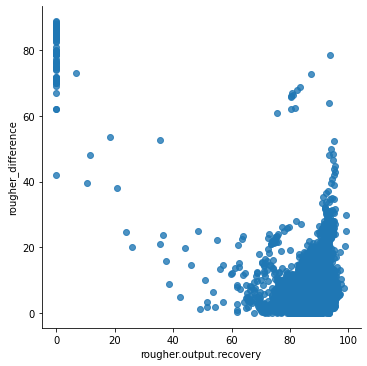

In [139]:
ax=sns.lmplot(x='rougher.output.recovery', y='rougher_difference', data=test_answers, fit_reg=False)

<AxesSubplot:>

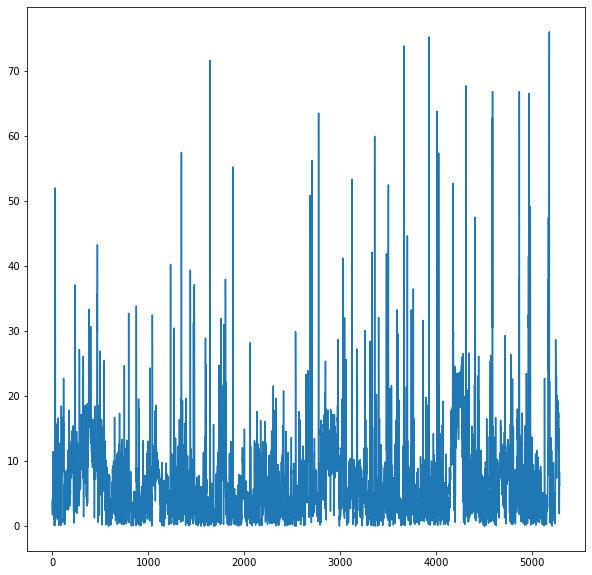

In [140]:
test_answers['cleaner_difference'].plot()

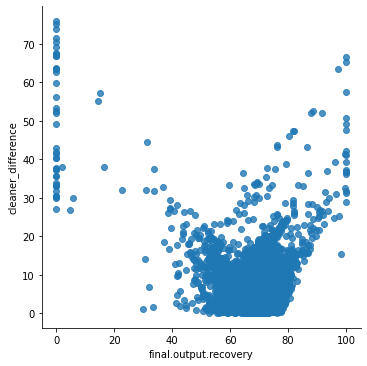

In [141]:
ax=sns.lmplot(x='final.output.recovery', y='cleaner_difference', data=test_answers, fit_reg=False)

Отклонения у нас также не только возрастают с возрастанием "правильного ответа" / предсказываемой величины, но и есть их существенные значения "около 0". Возможно, там, где есть нулевые значения "правильного ответа". 